In [1]:
import starry
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import pymc3.math as pmm
import pymc3_ext as pmx
import exoplanet
from starry_process import StarryProcess, MCMCInterface
from starry_process.math import cho_factor, cho_solve
import starry_process 
import theano
theano.config.gcc__cxxflags += " -fexceptions"
theano.config.on_opt_error = "raise"
theano.tensor.opt.constant_folding
theano.graph.opt.EquilibriumOptimizer
import aesara_theano_fallback.tensor as tt
from theano.tensor.slinalg import cholesky
from corner import corner
import arviz as az
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from tqdm import tqdm
from theano.tensor.random.utils import RandomStream
import scipy.linalg as sl
import scipy.stats as ss
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import lightkurve as lk

starry.config.quiet = True
np.random.seed(1)

import warnings

# Ignore all warnings (not recommended, might hide other important warnings)
warnings.filterwarnings("ignore")

# Ignore specific warning by type
warnings.filterwarnings("ignore", message="Cannot construct a scalar test value from a test value with no size")

# Set logging level to ignore these warnings (recommended)
import logging
logger = logging.getLogger("theano.tensor.opt")
logger.setLevel(logging.ERROR)


WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'
The version of PyMC you are using is very outdated.

Please upgrade to the latest version of PyMC https://www.pymc.io/projects/docs/en/stable/installation.html

Also notice that PyMC3 has been renamed to PyMC.
/Users/sabina/miniconda3/envs/starry-env/lib/python3.9/site-packages/lightkurve/config/__init__.py:119: UserWarning: The default Lightkurve cache directory, used by download(), etc., has been moved to /Users/sabina/.lightkurve/cache. Please move all the files in the legacy directory /Users/sabina/.lightkurve-cache to the new location and remove the legacy directory. Refer to https://docs.lightkurve.org/reference/config.html#default-cache-directory-migration for more information.
  warnings.warn(


In [2]:
import sys
sys.path.insert(1, '/Users/sabina/Desktop/GitHub/starry-project/scripts')

from starry_starry_process import StarryStarryProcess

In [3]:
def Inclination(name, testval=30):
    """
    An isotropic distribution for inclination angles (in degrees).
    
    """
    def logp(x):
        return tt.log(np.pi / 180 * tt.sin(x * np.pi / 180))

    def random(*args, **kwargs):
        return tt.arccos(pm.Uniform.dist(0, 1).random(*args, **kwargs)) * 180 / np.pi

    return pm.DensityDist(
        name,
        logp,
        random=random,
        initval=testval,
    )

def Angle(*args, **kwargs):
    """
    A uniform distribution for angles in [-180, 180).
    
    """
    if kwargs.get("testval", None) is not None:
        kwargs["testval"] *= np.pi / 180
    return 180 / np.pi * pmx.Angle(*args, **kwargs)

def Planet_Inc(name, *args, **kwargs):
    bmax = params[name].get('bmax')
    b = pm.Uniform('b', -bmax, bmax)
    planet_inc = pm.Deterministic(name, 180.0/np.pi*np.arccos(b))
    
    return planet_inc

def Planet_w(name, *args, **kwargs):
    w_x = pm.Normal('w_x', mu=0, sigma=1, testval=1)
    w_y = pm.Normal('w_y', mu=0, sigma=1, testval=1)
    planet_w = pm.Deterministic(name, 180.0/np.pi*tt.arctan2(w_y, w_x))
    
    return planet_w

def xyz_transform(x_, y_, z_):
    x = x_
    y = (np.sqrt(2)/2) * (z_ + y_)
    z = (np.sqrt(2)/2) * (z_ - y_)

    return x, y, z

def xyz_transform_back(x, y, z):
    x_ = x
    y_ = (np.sqrt(2)/2) * (y - z)
    z_ = (np.sqrt(2)/2) * (y + z)

    return x_, y_, z_

def Stellar_Ori():
    stellar_ori_x_ = pm.Normal('stellar_ori_x_', mu=0, sigma=1, testval=1)
    stellar_ori_y_ = pm.Normal('stellar_ori_y_', mu=0, sigma=1, testval=1)
    stellar_ori_z_ = pm.HalfNormal('stellar_ori_z_', sigma=1, testval=1)

    stellar_ori_x, stellar_ori_y, stellar_ori_z = xyz_transform(stellar_ori_x_, stellar_ori_y_, stellar_ori_z_)

    stellar_obl = pm.Deterministic('star.obl', 180.0/np.pi*tt.arctan2(stellar_ori_y, stellar_ori_x))
    stellar_inc = pm.Deterministic('star.inc', 180.0/np.pi*tt.arccos(stellar_ori_z / tt.sqrt(tt.square(stellar_ori_x) + tt.square(stellar_ori_y) + tt.square(stellar_ori_z))))
    
    return stellar_inc, stellar_obl
    # if "inc" in name:
    #     return stellar_inc
    
    # elif "obl" in name:
    #     return stellar_obl

def Period(name, *args, **kwargs):
    Ttotal = t[-1] - t[0]
    frac_bounds = params[name].get('frac_bounds')

    if kwargs.get("testval", None) is not None:
        trueval = kwargs["testval"]

    def logp(trueval, frac_bounds):
        return pm.Uniform(name+'logp',tt.log(trueval) + np.log1p(-frac_bounds), tt.log(trueval) + np.log1p(frac_bounds))

    period = pm.Deterministic(name, tt.exp(logp(trueval, frac_bounds)))

    return period

def Logarithmic(name, *args, **kwargs):
    if kwargs.get("testval", None) is not None:
        trueval = kwargs["testval"]
    log_rp = pm.Uniform(name+'log', tt.log(trueval/2), tt.log(2*trueval))
    rp = pm.Deterministic(name, tt.exp(log_rp))

    return rp

# Shorthand for the usual Uniform distribution
Uniform = pm.Uniform

In [4]:
def gp_model(t, flux, sigma_flux, params):
    # Helper function to instantiate parameters
    def parameter(name):
        param = params[name]
        if param.get("free", False):
            args = param.get("args", [])
            kwargs = param.get("kwargs", {})
            testval = param.get("testval", param["truth"])
            return param["dist"](name, *args, testval=testval, **kwargs)
            
        else:
            return param["truth"]
    
    starry.config.lazy = True
        
    with pm.Model() as model:

        prot = parameter('star.prot')

        porb = parameter('planet.porb')
        t0 = parameter('planet.t0')
        rp = parameter('planet.r')
        planet_inc = parameter('planet.inc')
        mp = parameter('planet.m')
        ecc = parameter('planet.ecc')
        Omega = parameter('planet.Omega')
        w = parameter('planet.w')

        map_model = starry.Map(ydeg=15, udeg=2)

        stellar_inc, stellar_obl = Stellar_Ori()
        # map_model.inc = parameter('star.inc')
        # map_model.obl = parameter('star.obl')
        map_model.inc = stellar_inc
        map_model.obl = stellar_obl
        
        map_model[1] = parameter('star.u1')
        map_model[2] = parameter('star.u2')
        
        pri_model = starry.Primary(map_model, 
            r=parameter('star.r'), 
            m=parameter('star.m'), 
            prot=prot)

        sec_model = starry.kepler.Secondary(starry.Map(0,0), 
            t0=t0, 
            r=rp, 
            m=mp, 
            porb=porb, 
            ecc=ecc, 
            Omega=Omega, 
            inc=planet_inc,
            w=w)
    
        sys_model = starry.System(pri_model, sec_model)

        sp_model = StarryProcess(
            # a = parameter("gp.a"),
            # b = parameter("gp.b"),
            mu = parameter('gp.mu'),
            sigma = parameter('gp.sigma'),
            c = parameter("gp.c"),
            r = parameter("gp.r"),
            n = parameter("gp.n"),
            ydeg = 15,
        )

        ssp_model = StarryStarryProcess(sys_model, sp_model)
        ssp_model.compute(t, flux, sigma_flux)
        
        pm.Deterministic(f'flux_model', tt.dot(ssp_model.design_matrix, ssp_model.sample_ylm_conditional(t, flux, sigma_flux)[0]))
        # pm.Deterministic(f'design_matrix_{i}', tt.constant(ssp_model.design_matrix))
        pm.Deterministic(f'max_map', ssp_model._a)

        loglike = ssp_model.marginal_likelihood(t, flux, sigma_flux)
            
        pm.Potential('marginal_likelihood', loglike)


    return model

In [5]:
def bin_out_of_transit(t, flux, err, params, dt=0.06, binsize=30):
    """
    Bin the out of transit points to speed things up.
    
    """
    # Find in-transit and out-of-transit points
    idx = np.zeros(len(t), dtype=bool)
    ntransits = int(np.ceil(t[-1] / params["planet.porb"]["truth"]))
    for n in range(ntransits):
        t0 = params["planet.t0"]["truth"] + n * params["planet.porb"]["truth"]
        idx |= ((t > t0 - dt) & (t < t0 + dt))
    t_in = t[idx]
    f_in = flux[idx]
    t_out = t[~idx]
    f_out = flux[~idx]

    # Make the size of the out-of-transit array divisible by binsize
    # so we can bin by simple array reshaping
    trim = len(t_out) % binsize
    t_out = t_out[:-trim]
    f_out = f_out[:-trim]

    # We need to be careful not to bin *across* the transit, so
    # let's NaN-out points right _before_ each transit
    f_out[np.where(np.diff(t_out) > 0.1)] = np.nan

    # Bin the out-of-transit data
    t_out = t_out.reshape(-1, binsize).mean(axis=1)
    f_out = f_out.reshape(-1, binsize).mean(axis=1)

    # Remove any nans (the averages *across* transits)
    idx = np.isnan(f_out)
    t_out = t_out[~idx]
    f_out = f_out[~idx]

    # Error arrays
    e_in = err[0] * np.ones_like(t_in)
    e_out = (err[0] / np.sqrt(binsize)) * np.ones_like(t_out)

    # Sort and merge the arrays
    t_ = np.concatenate((t_in, t_out))
    f_ = np.concatenate((f_in, f_out))
    e_ = np.concatenate((e_in, e_out))
    idx = np.argsort(t_)
    t_ = t_[idx]
    flux_ = f_[idx]
    err_ = e_[idx]

    return t_, flux_, err_

In [6]:
# True parameters & priors
params = {
    "planet.inc": {"truth": 90., "dist": Planet_Inc},
    "planet.ecc": {"truth": 0.2, "dist": Uniform, "args": [0.0, 0.9]},
    "planet.Omega": {"truth": 0.0, "dist": Angle},
    "planet.porb": {"truth": 5., "dist": Period},
    "planet.t0": {"truth": 0.5, "dist": Uniform, "args": [-0.6, 0.6]},
    "planet.r": {"truth": 0.04, "dist": Logarithmic},
    "planet.m": {"truth":  1e-3, "dist": Uniform, "args": [1e-4, 1e-2]},
    "planet.w": {"truth": 60, "dist": Planet_w},

    "star.inc": {"truth": 90, "dist": Stellar_Ori},
    "star.m": {"truth": 1, "dist": Uniform, "args": [0.9,1.1]},
    "star.u1": {"truth": 0.4, "dist": Uniform, "args": [0.0, 0.6]},
    "star.u2": {"truth": 0.26, "dist": Uniform, "args": [0.0, 0.4]},
    "star.prot": {"truth": 30., "dist": Period},
    "star.obl": {"truth": -30, "dist": Stellar_Ori},
    "star.r": {"truth": 1, "dist": Uniform, "args": [0.9,1.1]},

    # "gp.a": {"truth": 0.2, "dist": Uniform, "args": [0., 1.]},
    # "gp.b": {"truth": 0.1, "dist": Uniform, "args": [0., 1.]},
    "gp.mu": {"truth": 30., "dist": Uniform, "args": [1., 80.]},
    "gp.sigma": {"truth": 5., "dist": Uniform, "args": [0., 10.]},
    "gp.r": {"truth": 10, "dist": Uniform, "args": [5.0, 25.0]},
    "gp.c": {"truth": 0.5, "dist": Uniform, "args": [0.01, 1]},
    "gp.n": {"truth": 3, "dist": Uniform, "args": [0, 10]},
}

In [7]:
t = np.arange(0, 90, 2 / 24 / 60) # 90 days of observations with a 2-min cadence

In [8]:
map = starry.Map(15, 2)
map.inc = params["star.inc"]["truth"]
map.obl = params["star.obl"]["truth"]
map[1] = params["star.u1"]["truth"]
map[2] = params["star.u2"]["truth"]
star = starry.Primary(map, r=params["star.r"]["truth"], m=params["star.m"]["truth"], prot=params["star.prot"]["truth"]) 
planet = starry.Secondary(
    starry.Map(0,0),
    inc=params["planet.inc"]["truth"],
    ecc=params["planet.ecc"]["truth"],
    Omega=params["planet.Omega"]["truth"],
    porb=params["planet.porb"]["truth"],
    t0=params["planet.t0"]["truth"],
    r=params["planet.r"]["truth"],
    m=params["planet.m"]["truth"],
    prot=1.0
)

sys = starry.System(star, planet)
xo, yo, zo = sys.position(t)
xo = xo.eval()[1]
yo = yo.eval()[1]
zo = zo.eval()[1]
theta = (360 * t / params["star.prot"]["truth"]) % 360
    
sp = StarryProcess(
    # a=params["gp.a"]["truth"],
    # b=params["gp.b"]["truth"],
    mu=params["gp.mu"]["truth"],
    sigma=params["gp.sigma"]["truth"],
    r=params["gp.r"]["truth"],
    c=params["gp.c"]["truth"],
    n=params["gp.n"]["truth"],
)

nt = len(t)
ssp = StarryStarryProcess(sys, sp)

y_true = sp.sample_ylm().eval().reshape(-1)
y_true[0] += 1
map[:,:] = y_true

# Setting the priors
Ttotal = t[-1] - t[0]
# fraction bounds for period priors
prot_frac_bounds = min(params['star.prot']['truth']/Ttotal/2, 0.25)
porb_frac_bounds = min(params['planet.porb']['truth']/Ttotal/2, 0.25)

# Let's add this parameter to the parameter dictionary as a prior
params['star.prot']['frac_bounds'] = prot_frac_bounds
params['planet.porb']['frac_bounds'] = porb_frac_bounds

# semi-major axis
a = (params['star.m']['truth']*np.square(params['planet.porb']['truth']/365.25))**(1/3) * 215.03 # Solar radii
# impact parameter
bmax = params['star.r']['truth'] / a

# Let's add this parameter to the parameter dictionary as a prior
params['planet.inc']['bmax'] = bmax

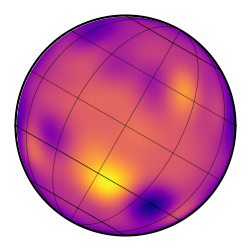

In [10]:
map.show()

In [12]:
sys.show(t[::10])

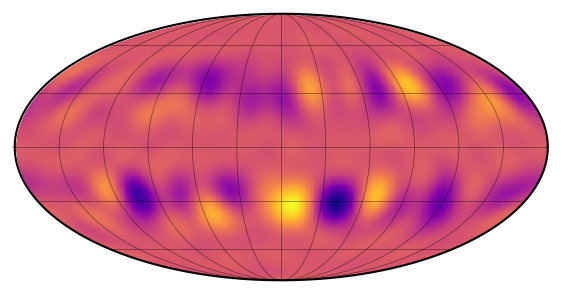

In [12]:
map.show(projection='moll')

In [9]:
theta = (360 * t / params["star.prot"]['truth']) % 360
xo, yo, zo = sys.position(t)
xo = xo.eval()[1]
yo = yo.eval()[1]
zo = zo.eval()[1]
A = map.design_matrix(
    theta=theta, xo=xo, yo=yo, zo=zo, ro=params["planet.r"]['truth']
).eval()

In [10]:
rng = np.random.default_rng(9878997)
flux_true = A @ y_true
sigma_flux = 1e-4*np.ones_like(flux_true)
flux_obs = flux_true + sigma_flux*rng.normal(size=len(t))

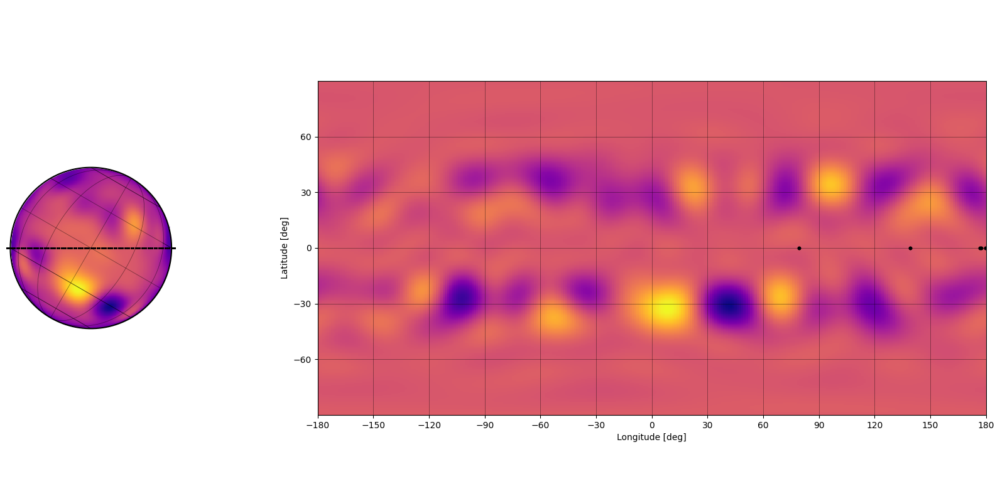

In [11]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))
idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)
ax[0].plot(xo[idx], yo[idx], "k.", ms=1);
ax[0].set_aspect(1)
ax[0].axis("off")
map[:, :] = y_true
map.show(ax=ax[0])
ax[0].set_ylim(-3, 3)
idx = (zo > 0) & (xo ** 2 + yo ** 2 < 1)
lat = 180 / np.pi * np.arcsin(yo[idx])
lon = 180 / np.pi * np.arcsin(xo[idx] / np.sqrt(1 - yo[idx] ** 2)) - theta[idx]
lon = (lon + 180) % 360 - 180
mask = np.append(np.array(lon[1:] > lon[:-1], dtype=float), 0)
mask[mask == 1] = np.nan
map.show(ax=ax[1], projection="rect")
ax[1].plot(lon, lat + mask, "k.");
plt.tight_layout()
plt.savefig("figures/experiment-1-true-map.pdf", bbox_inches="tight", dpi=300)

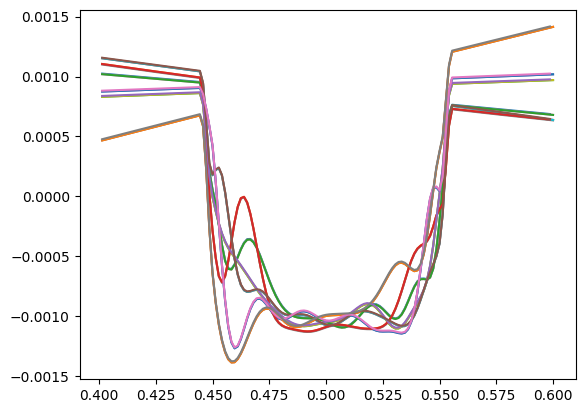

In [17]:
ntransits = int(np.ceil(t[-1] / planet.porb.eval()))
fig, ax = plt.subplots(1, 1)
for n in range(ntransits):
    idx = (t > planet.t0.eval()+n*planet.porb.eval()-0.1) &  (t<planet.t0.eval()+n*planet.porb.eval()+0.1)
    plt.plot(t[idx] % planet.porb.eval(), flux_true[idx] - np.mean(flux_true[idx]))

In [16]:
t_, flux_, sigma_flux_ = bin_out_of_transit(t, flux_obs, sigma_flux, params, binsize=100)

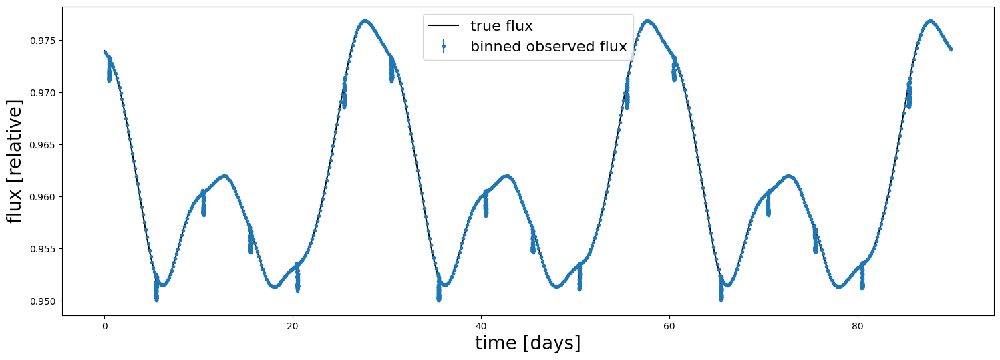

In [19]:
plt.figure(figsize=(18,6))
plt.plot(t, flux_true, color='k', label='true flux')
plt.errorbar(t_, flux_, yerr=sigma_flux_, fmt='.', color='C0', label='binned observed flux')
plt.ylabel("flux [relative]", fontsize=20)
plt.xlabel("time [days]", fontsize=20)
plt.legend(fontsize=16);
plt.savefig("figures/experiment-1-lc.pdf", bbox_inches="tight", dpi=300)
# plt.xlim(0,20)

(15.0, 16.0)

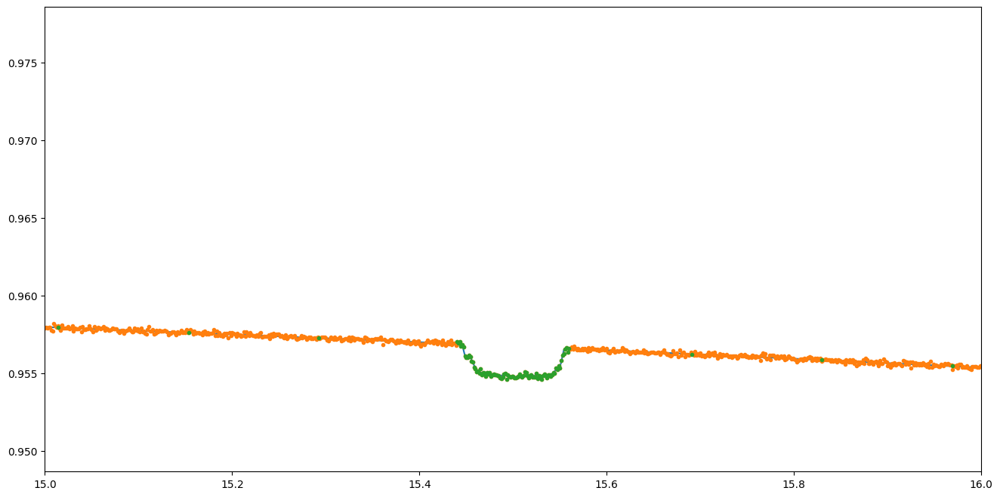

In [20]:
plt.figure(figsize=(16,8))
plt.plot(t, flux_true)
plt.plot(t, flux_obs, '.')
plt.plot(t_, flux_, '.')
plt.xlim(15, 16)

In [21]:
np.sum(np.isnan(flux_))

0

In [22]:
# True parameters & priors
truths = {
    "planet.inc": 90.,
    "planet.ecc": 0.2,
    "planet.Omega": 0.0, 
    "planet.porb": 5.,
    "planet.t0": 0.5,
    "planet.r": 0.04,
    "planet.m": 1e-3,
    "planet.w": 60,

    "star.inc": 90,
    "star.m": 1,
    "star.u1": 0.4,
    "star.u2": 0.26, 
    "star.prot": 30., 
    "star.obl": -30, 
    "star.r": 1, 

    "gp.mu": 30., 
    "gp.sigma": 5., 
    "gp.r":  10, 
    "gp.c": 0.5,
    "gp.n": 3, 
}

In [ ]:
def inv_logit(x, a, b):
    y = 1/(1 + np.exp(-x))
    return a + (b-a)*y

def logit(y, a, b):
    yy = (b-y)/(b-a)
    return np.log1p(-yy) -np.log(yy)

def log_jacobian_inv_logit(y, x, a, b):
    # dy/dx = 1/(1+exp(-x))^2 * exp(-x) = y^2 exp(-x)
    if x < 0:
        return np.log(b-a) + x - 2*np.log1p(np.exp(x))
    else:
        return np.log(b-a) - x - 2*np.log1p(np.exp(-x))

# Planetary inclination
# semi-major axis
a = (truths['star.m']*np.square(truths['planet.porb']/365.25))**(1/3) * 215.03 # Solar radii
# impact parameter
bmax = truths['star.r'] / a

def unpack_parameters(xs, return_logjac=False):
    logjac = 0.0

    impact_parameter_logit, eccentricity_logit, f_porb_logit, f_t0_logit, w_x, w_y, stellar_x_, stellar_y_, stellar_z__log, u1_logit, u2_logit, f_prot_logit, gp_r_logit, gp_c_logit, gp_n_logit, gp_mu_logit, gp_sigma_logit, stellar_mass_logit, planet_radius_logit = xs

    impact_parameter = inv_logit(impact_parameter_logit, -bmax, bmax)
    if return_logjac:
        logjac += log_jacobian_inv_logit(impact_parameter, impact_parameter_logit, -bmax, bmax)

    eccentricity = inv_logit(eccentricity_logit, 0, 1)
    if return_logjac:
        logjac += log_jacobian_inv_logit(eccentricity, eccentricity_logit, 0, 1)

    f_porb = inv_logit(f_porb_logit, 0.99, 1.01)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_porb, f_porb_logit, 0.99, 1.01)

    porb = truths['planet.porb']*f_porb
    if return_logjac:
        logjac += np.log(truths['planet.porb'])

    f_t0 = inv_logit(f_t0_logit, 0.9, 1.1)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_t0, f_t0_logit, 0.9, 1.1)

    t0 = truths['planet.t0'] + truths['planet.porb']*(f_t0-1)
    if return_logjac:
        logjac += np.log(truths['planet.porb'])

    planet_radius_log = inv_logit(planet_radius_logit, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))
    if return_logjac:
        logjac += log_jacobian_inv_logit(planet_radius_log, planet_radius_logit, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))

    stellar_z_ = np.exp(stellar_z__log)
    if return_logjac:
        logjac += stellar_z__log
    
    stellar_mass = inv_logit(stellar_mass_logit, 0.9, 1.1)
    if return_logjac:
        logjac += log_jacobian_inv_logit(stellar_mass, stellar_mass_logit, 0.9, 1.1)

    u1 = inv_logit(u1_logit, 0, 0.6)
    if return_logjac:
        logjac += log_jacobian_inv_logit(u1, u1_logit, 0, 0.6)

    u2 = inv_logit(u2_logit, 0, 0.4)
    if return_logjac:
        logjac += log_jacobian_inv_logit(u2, u2_logit, 0, 0.4)

    f_prot = inv_logit(f_prot_logit, 0.8, 1.2)
    if return_logjac:
        logjac += log_jacobian_inv_logit(f_prot, f_prot_logit, 0.8, 1.2)

    prot = f_prot*truths['star.prot']
    if return_logjac:
        logjac += np.log(truths['star.prot'])

    gp_r = inv_logit(gp_r_logit, 5.0, 25.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_r, gp_r_logit, 5.0, 25.0)

    gp_c = inv_logit(gp_c_logit, 0.01, 0.9)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_c, gp_c_logit, 0.01, 0.9)

    gp_n = inv_logit(gp_n_logit, 0.1, 10.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_n, gp_n_logit, 0.1, 10.0)

    gp_mu = inv_logit(gp_mu_logit, 1.0, 80.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_mu, gp_mu_logit, 1.0, 80.0)

    gp_sigma = inv_logit(gp_sigma_logit, 0.1, 10.0)
    if return_logjac:
        logjac += log_jacobian_inv_logit(gp_sigma, gp_sigma_logit, 0.1, 10.0)

    params = (impact_parameter, eccentricity, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log)
    if return_logjac:
        return params, logjac
    else:
        return params
    
def pack_parameters(pars):
    (impact_parameter, eccentricity, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log) = pars

    ip_logit = logit(impact_parameter, -bmax, bmax)
    e_logit = logit(eccentricity, 0, 1)
    f_porb_logit = logit(porb/truths['planet.porb'], 0.99, 1.01)
    planet_radius_logit = logit(planet_radius_log, np.log(truths['planet.r'] / 2), np.log(truths['planet.r'] * 2))
    f_t0_logit = logit((t0-truths['planet.t0'])/truths['planet.porb'] + 1, 0.9, 1.1)
    stellar_z__log = np.log(stellar_z_)
    stellar_mass_logit = logit(stellar_mass, 0.9, 1.1)
    u1_logit = logit(u1, 0, 0.6)
    u2_logit = logit(u2, 0, 0.4)
    f_prot_logit = logit(prot / truths['star.prot'], 0.8, 1.2)
    gp_r_logit = logit(gp_r, 5.0, 25.0)
    gp_c_logit = logit(gp_c, 0.01, 0.9)
    gp_n_logit = logit(gp_n, 0.1, 10.0)
    gp_mu_logit = logit(gp_mu, 1.0, 80.0)
    gp_sigma_logit = logit(gp_sigma, 0.1, 10.0)

    return (ip_logit, e_logit, f_porb_logit, f_t0_logit, w_x, w_y, stellar_x_, stellar_y_, stellar_z__log, u1_logit, u2_logit, f_prot_logit, gp_r_logit, gp_c_logit, gp_n_logit, gp_mu_logit, gp_sigma_logit, stellar_mass_logit, planet_radius_logit)

def lprior(x):
    logp = 0.0

    (b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log), logjac = unpack_parameters(x, return_logjac=True)

    # Flat priors on b, e, porb, t0

    # Gaussian on w_x, w_y
    logp += -0.5*(w_x*w_x + w_y*w_y) - 2*np.log(np.sqrt(2*np.pi)) 

    # Gaussian on the xyz_
    logp += -0.5*(stellar_x_*stellar_x_ + stellar_y_*stellar_y_ + stellar_z_*stellar_z_) - 3*np.log(np.sqrt(2*np.pi))

    # Flat on u1, u2, prot, and all the gp parameters

    return logp + logjac

In [30]:
npar = 19
packed_pars = np.random.randn(npar)
np.abs(packed_pars - pack_parameters(unpack_parameters(packed_pars, return_logjac=False)))

array([4.44089210e-16, 1.11022302e-16, 1.58761893e-14, 4.44089210e-16,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       1.38777878e-17, 2.22044605e-16, 2.22044605e-16, 4.44089210e-16,
       0.00000000e+00, 2.22044605e-16, 1.11022302e-16, 2.22044605e-16,
       0.00000000e+00, 1.55431223e-15, 4.44089210e-16])

In [31]:
def log_likelihood(x):
    """Calculate log likelihood"""
    
    (b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log) = unpack_parameters(x, return_logjac=False)
    try:
        return log_likelihood_fn(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log)
    except (np.linalg.LinAlgError, ValueError):
        return -np.inf

def log_likelihood_from_scalars(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log): 
    map_model = starry.Map(ydeg=15, udeg=2)

    stellar_ori_x, stellar_ori_y, stellar_ori_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
    
    map_model.inc = 180.0/np.pi*tt.arccos(stellar_ori_z / tt.sqrt(tt.square(stellar_ori_x) + tt.square(stellar_ori_y) + tt.square(stellar_ori_z)))
    map_model.obl = 180.0/np.pi*tt.arctan2(stellar_ori_y, stellar_ori_x)
    
    map_model[1] = u1
    map_model[2] = u2
    
    pri_model = starry.Primary(
        map_model,
        r=truths['star.r'],
        m=stellar_mass,
        prot=prot
    )
    
    sec_model = starry.kepler.Secondary(
        starry.Map(0,0),
        t0=t0,
        r=np.exp(planet_radius_log),
        m=truths['planet.m'],
        porb=porb,
        ecc=e,
        Omega=truths['planet.Omega'],
        inc=180.0/np.pi*tt.arccos(b),
        w=180.0/np.pi*tt.arctan2(w_y, w_x)
    )
    
    sys_model = starry.System(pri_model, sec_model)
    
    sp_model = StarryProcess(
        mu=gp_mu,
        sigma=gp_sigma,
        c=gp_c,
        r=gp_r,
        n=gp_n,
        ydeg=15
    )
    
    log_like = 0
    
    ssp_model = StarryStarryProcess(sys_model, sp_model)
    ssp_model.compute(t_, flux_, sigma_flux_)
        
    log_like += ssp_model.marginal_likelihood(
        t_, 
        flux_, 
        sigma_flux=sigma_flux_
    )
        
    return log_like

b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log = [tt.dscalar() for _ in range(19)]
log_likelihood_fn = theano.function([b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log], log_likelihood_from_scalars(b, e, porb, t0, w_x, w_y, stellar_x_, stellar_y_, stellar_z_, u1, u2, prot, gp_r, gp_c, gp_n, gp_mu, gp_sigma, stellar_mass, planet_radius_log))

In [32]:
test_vals = [0.08, truths['planet.ecc'],truths['planet.porb'],truths['planet.t0'], 1, 1, 1, 1, 1, truths['star.u1'], truths['star.u2'], truths['star.prot'], truths['gp.r'], truths['gp.c'], truths['gp.n'], truths['gp.mu'], truths['gp.sigma'], 1, np.log(truths['planet.r'])]

In [33]:
test_pars = pack_parameters(test_vals)
lprior(test_pars), log_likelihood(test_pars)

(-23.707182606555868, array(-43171.58173566))

In [34]:
import ptemcee
ntemps = 8
nwalkers=40
ndim = len(test_vals)
sampler = ptemcee.Sampler(
    nwalkers=nwalkers, 
    ndim=ndim, 
    logl=log_likelihood,     
    logp=lprior,          
    betas=ptemcee.make_ladder(ndim=ndim, ntemps=ntemps,Tmax=np.inf),   
    adaptive=True, 
    adaptation_time=10,
    adaptation_lag=100,
)

In [35]:
p0 = test_pars + 1e-2*np.random.randn(ntemps, nwalkers, ndim)

In [36]:
chain = sampler.chain(p0)

In [37]:
niter = 2000
for _ in tqdm(chain.iterate(niter), total=niter):
    pass

100%|██████████| 2000/2000 [53:54:03<00:00, 97.02s/it]    


In [39]:
chain.x.shape

(2000, 8, 40, 19)

In [53]:
np.save("chain1_experiment1_2000.npy", chain.x)
np.save("betas1_experiment1_2000.npy", chain.betas)

In [66]:
chains = np.load('chain1_experiment1_2000.npy')

In [67]:
def analyze_chains(chains):
    # print("The mean jump acceptance ratio:", np.mean(chain.jump_acceptance_ratio, axis=1))
    # print("Chain swap acceptance ratio: ", chain.swap_acceptance_ratio)

    # plt.plot(np.mean(chain.logl[:,0,:], axis=1))
    # plt.xlabel('Iteration')
    # plt.ylabel(r'$\left\langle \log \mathcal{L} \right\rangle_{\beta=1}$')
    # plt.show()

    # target_samples = chain.x[:, 0, :, :]
    # par_means = np.mean(target_samples, axis=(0, 1))
    # par_stds = np.std(target_samples, axis=(0, 1))
    # for d in range(target_samples.shape[-1]):
    #     plt.plot((np.mean(target_samples[:, :, d], axis=1)-par_means[d])/par_stds[d])
    # plt.xlabel('Iteration')
    # plt.ylabel('(teration Mean - Mean)/(Standard Deviation)')
    # plt.show()

    chain.x = chains

    unpacked_transformed = np.zeros((chain.x.shape[0], chain.x.shape[2], chain.x.shape[3] - 2))
    for i in range(chain.x.shape[0]):
        for j in range(chain.x.shape[2]):
            original_params = unpack_parameters(chain.x[i,0,j,:], False)
            
            b = original_params[0]
            w_x = original_params[4]
            w_y = original_params[5]
            stellar_x_ = original_params[6]
            stellar_y_ = original_params[7]
            stellar_z_ = original_params[8]
            
            planet_w = 180.0/np.pi*np.arctan2(w_y, w_x)
            planet_inc = 180.0/np.pi*np.arccos(b)
            stellar_x, stellar_y, stellar_z = xyz_transform(stellar_x_, stellar_y_, stellar_z_)
            star_obl = -1*180.0/np.pi*np.arctan2(stellar_y, stellar_x)
            star_inc = 180.0/np.pi*np.arccos(stellar_z / np.sqrt(np.square(stellar_x) + np.square(stellar_y) + np.square(stellar_z)))
            
            unpacked_transformed[i,j,:] = np.array([
                planet_inc,           # transformed
                original_params[1],   # ecc
                original_params[2],   # porb
                original_params[3],   # t0
                planet_w,            # transformed
                star_inc,            # transformed
                star_obl,            # transformed
                original_params[9],   # u1
                original_params[10],  # u2
                original_params[11],  # prot
                original_params[12],  # gp_r
                original_params[13],  # gp_c
                original_params[14],  # gp_n
                original_params[15],  
                original_params[16],
                original_params[17],
                np.exp(original_params[18])
            ])
    labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r"]
    fig, ax = plt.subplots(chain.x.shape[3] - 2, figsize=(8, 22), sharex=True)
    for j in range(chain.x.shape[3] - 2):
        for k in range(nwalkers):
            ax[j].plot(unpacked_transformed[:, k, j], "C0-", lw=1, alpha=0.3)
        ax[j].set_ylabel(labels[j])
    ax[-1].set_xlabel("iteration")
    fig.align_ylabels(ax)
    plt.show()
    
    return unpacked_transformed

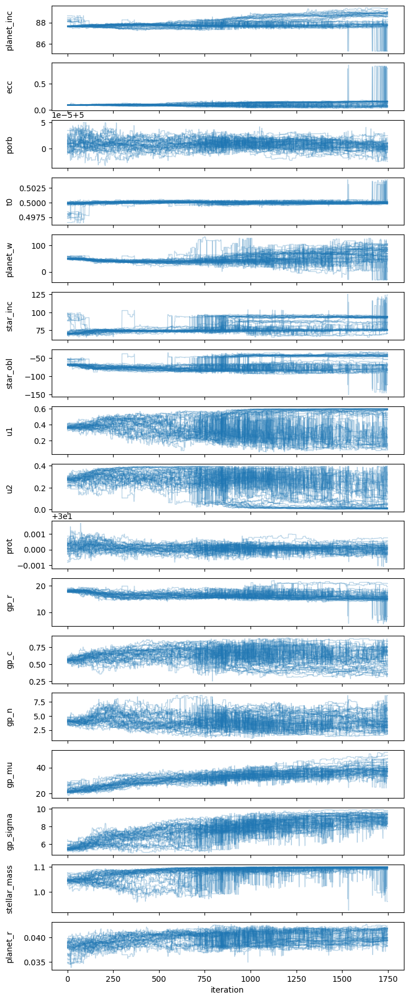

In [70]:
unpacked_transformed = analyze_chains(chains[250:])

In [43]:
p = dict(params)

p['planet.porb']['free'] = True
p['planet.t0']['free'] = True
p['planet.r']['free'] = True
p['planet.inc']['free'] = True
p['planet.ecc']['free'] = True
p['planet.w']['free'] = True

p['star.u1']['free'] = True
p['star.u2']['free'] = True

p['gp.c']['free'] = True
p['gp.mu']['free'] = True
p['gp.sigma']['free'] = True
p['gp.r']['free'] = True
p['gp.n']['free'] = True

p['star.prot']['free'] = True
p['star.obl']['free'] = True
p['star.inc']['free'] = True
p['star.m']['free'] = True

In [61]:
free = ["planet.inc", "planet.ecc", "planet.porb", "planet.t0", "planet.w", "star.inc","star.obl", "star.u1", "star.u2", "star.prot", "gp.r", "gp.c", "gp.n", "gp.mu", "gp.sigma", "star.m", "planet.r"]
free

['planet.inc',
 'planet.ecc',
 'planet.porb',
 'planet.t0',
 'planet.w',
 'star.inc',
 'star.obl',
 'star.u1',
 'star.u2',
 'star.prot',
 'gp.r',
 'gp.c',
 'gp.n',
 'gp.mu',
 'gp.sigma',
 'star.m',
 'planet.r']

In [64]:
truths['star.obl']

-30

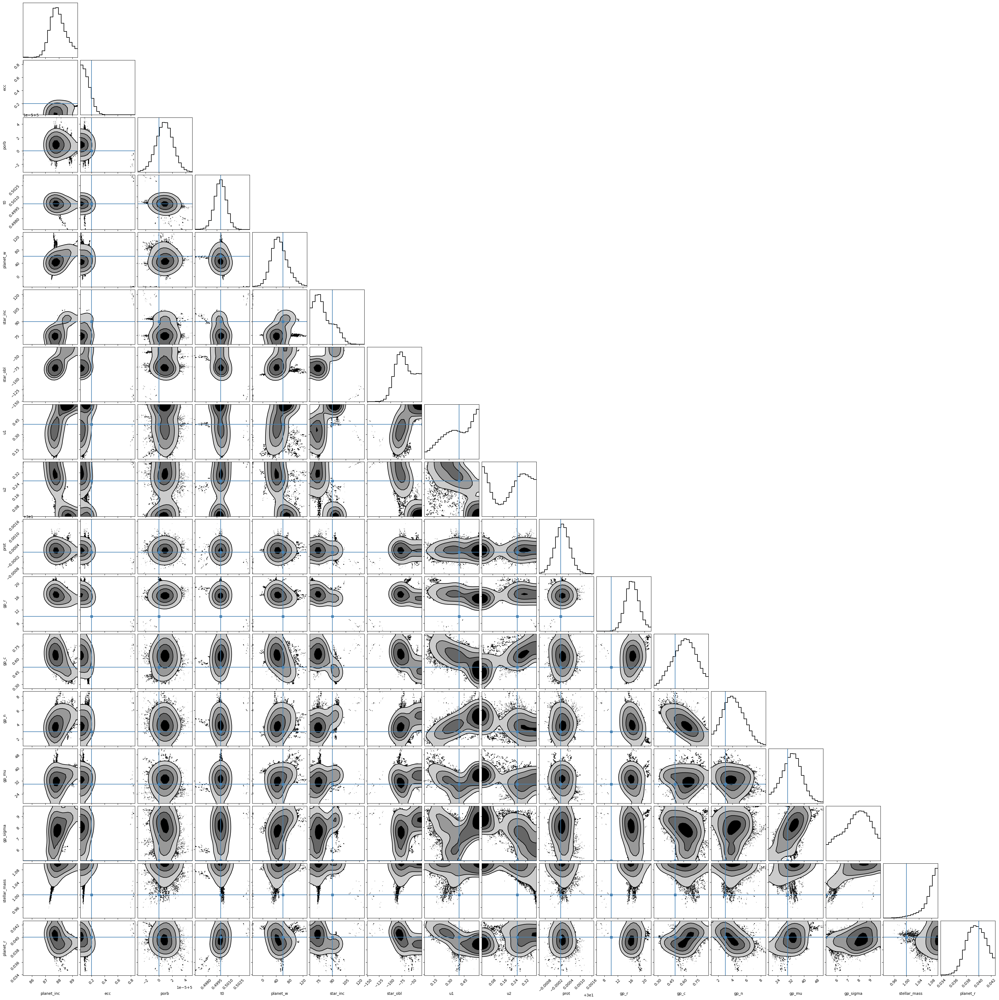

In [72]:
from corner import corner
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r"]
fig = corner(
    unpacked_transformed.reshape(1750*40, 17), labels=labels,
    truths=[params[x]['truth'] for x in free],
    color='k', 
    plot_datapoints=True,
    plot_density=False,
    fill_contours=True,
    smooth=2.,
    smooth1d=2.,
    hist_kwargs=dict(alpha=1)
);

In [73]:
chain.betas.shape

(2000, 8)

In [74]:
import ptemcee
ntemps = 8
nwalkers=40
ndim = len(test_vals)
sampler = ptemcee.Sampler(
    nwalkers=nwalkers, 
    ndim=ndim, 
    logl=log_likelihood,     
    logp=lprior,          
    betas=chain.betas[-1],   
    adaptive=True, 
    adaptation_time=10,
    adaptation_lag=100,
)

In [75]:
chain.x.shape

(1750, 8, 40, 19)

In [76]:
chain = sampler.chain(chain.x[-1])

In [77]:
niter = 2000
for _ in tqdm(chain.iterate(niter), total=niter):
    pass

100%|██████████| 2000/2000 [63:41:33<00:00, 114.65s/it]   


In [78]:
np.save("chain2_experiment1_2000.npy", chain.x)
np.save("betas2_experiment1_2000.npy", chain.betas)

In [79]:
chains = np.load("chain2_experiment1_2000.npy")

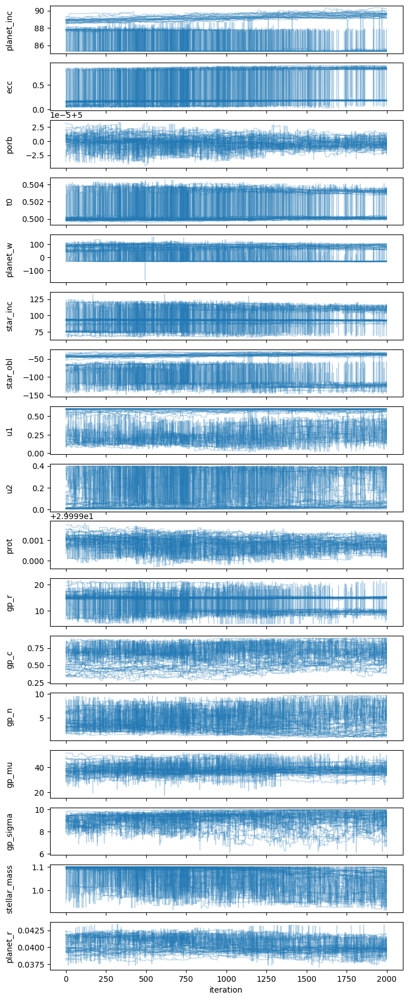

In [80]:
unpacked_transformed = analyze_chains(chains)

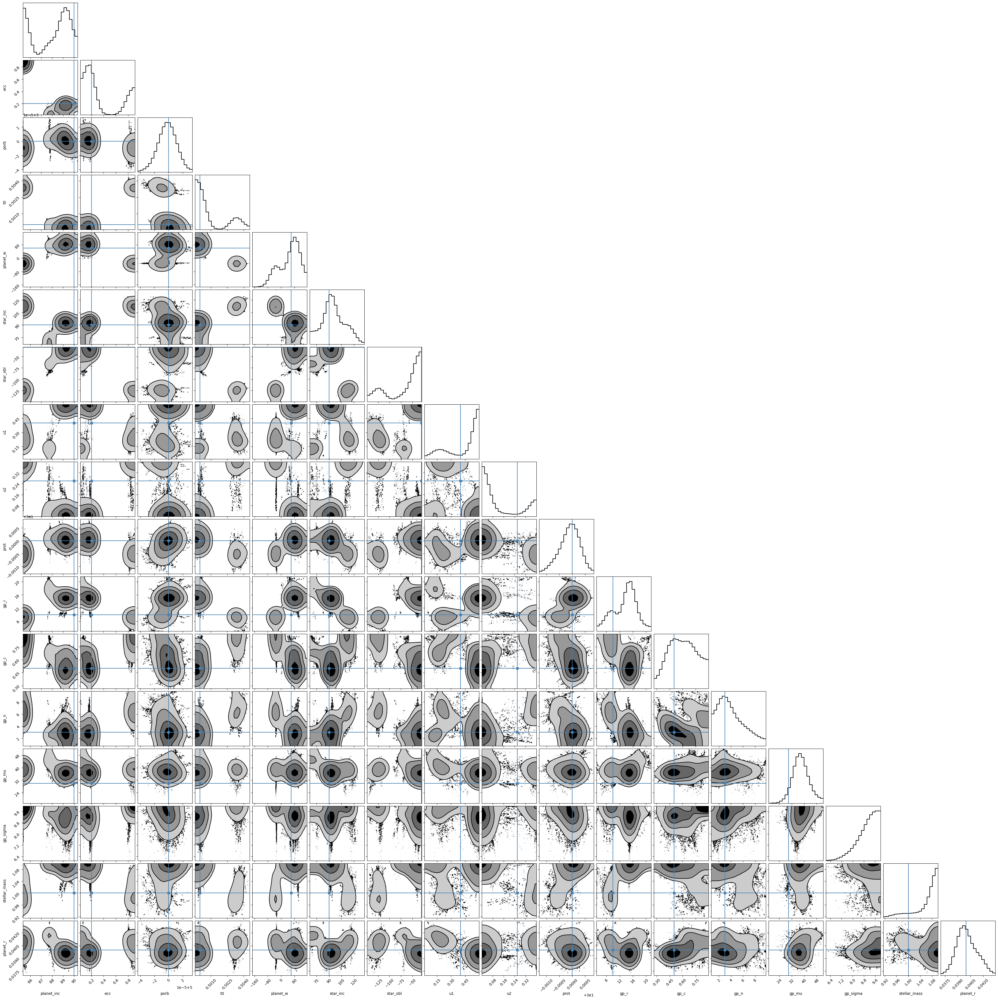

In [81]:
from corner import corner
labels = ["planet_inc", "ecc", "porb", "t0", "planet_w", "star_inc","star_obl", "u1", "u2", "prot", "gp_r", "gp_c", "gp_n", "gp_mu", "gp_sigma", "stellar_mass", "planet_r"]
fig = corner(
    unpacked_transformed.reshape(2000*40, 17), labels=labels,
    truths=[params[x]['truth'] for x in free],
    color='k', 
    plot_datapoints=True,
    plot_density=False,
    fill_contours=True,
    smooth=2.,
    smooth1d=2.,
    hist_kwargs=dict(alpha=1)
);

In [78]:
# Set some free params & get the model
p = dict(params)

p['planet.porb']['free'] = True
p['planet.t0']['free'] = True
p['planet.r']['free'] = True
p['planet.inc']['free'] = True
p['planet.ecc']['free'] = True
p['planet.w']['free'] = True

p['star.u1']['free'] = True
p['star.u2']['free'] = True

p['gp.c']['free'] = True
p['gp.mu']['free'] = True
p['gp.sigma']['free'] = True
p['gp.r']['free'] = True
p['gp.n']['free'] = True

p['star.prot']['free'] = True
p['star.obl']['free'] = True
p['star.inc']['free'] = True
p['star.m']['free'] = True

free = [x for x in p.keys() if p[x].get("free", False)]
model = gp_model(t_, flux_, sigma_flux_, p)

In [79]:
t_.shape

(2180,)

In [80]:
best_params = {}
best_params['star.inc'] = params['star.inc']['truth']
best_params['star.obl'] = params['star.obl']['truth']
best_params['star.m'] = params['star.m']['truth']
best_params['gp.mu'] = params['gp.mu']['truth']
best_params['gp.sigma'] = params['gp.sigma']['truth']
best_params['gp.c'] = params['gp.c']['truth']
best_params['gp.n'] = params['gp.n']['truth']
best_params['gp.r'] = params['gp.r']['truth']
best_params['star.prot'] = params['star.prot']['truth']
best_params['planet.porb'] = params['planet.porb']['truth']
best_params['planet.t0'] = params['planet.t0']['truth']
best_params['planet.ecc'] = params['planet.ecc']['truth']
best_params['planet.r'] = params['planet.r']['truth']
best_params['star.u1'] = params['star.u1']['truth']
best_params['star.u2'] = params['star.u2']['truth']
best_params['planet.inc'] = params['planet.inc']['truth']

In [81]:
with model:
    map_soln = pmx.optimize(start=best_params)
    for x in free:
        print(f"{x}: {map_soln[x]} {[params[x]['truth']]}")

optimizing logp for variables: [gp.n, gp.r, gp.c, gp.sigma, gp.mu, star.m, star.u2, star.u1, stellar_ori_z_, stellar_ori_y_, stellar_ori_x_, w_y, w_x, planet.ecc, b, planet.rlog, planet.t0, planet.porblogp, star.protlogp]



planet.inc: 90.01482145568401 [90.0]
planet.ecc: 0.20882682641916295 [0.2]
planet.porb: 5.0000016709373485 [5.0]
planet.t0: 0.5000353357516233 [0.5]
planet.r: 0.040248398515153536 [0.04]
planet.w: 110.33787095634698 [60]
star.inc: 90.30706656348818 [90]
star.m: 1.0077612962094176 [1]
star.u1: 0.3770191002655388 [0.4]
star.u2: 0.2946924293284887 [0.26]
star.prot: 29.999995239782947 [30.0]
star.obl: 30.522301102859657 [-30]
gp.mu: 30.38618426769324 [30.0]
gp.sigma: 5.146283357340508 [5.0]
gp.r: 9.38569634746939 [10]
gp.c: 0.38295237923363046 [0.5]
gp.n: 4.07239385463974 [3]


message: Desired error not necessarily achieved due to precision loss.
logp: -2979456.979042176 -> 18107.900876023432


(34.0, 36.0)

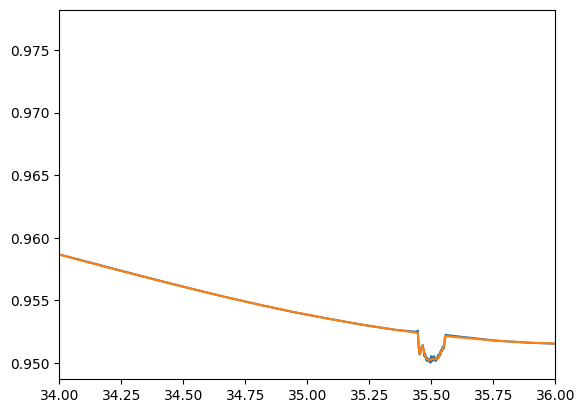

In [82]:
plt.plot(t_, flux_)
plt.plot(t_, map_soln['flux_model'])
plt.xlim(34,36)

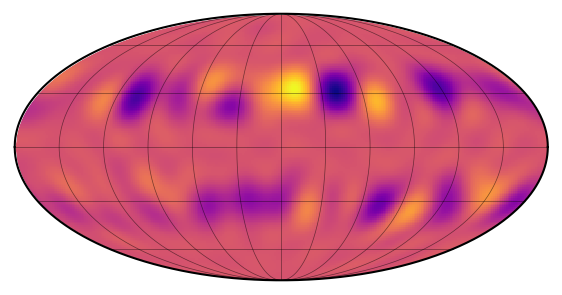

In [83]:
sp.visualize(map_soln['max_map'])

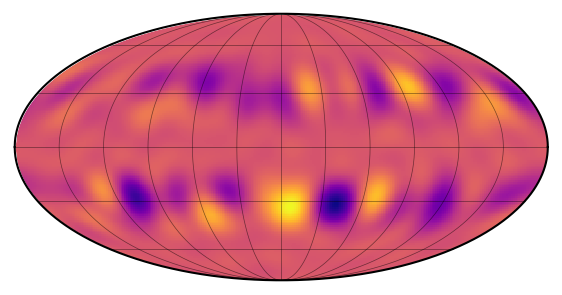

In [84]:
sp.visualize(y_true)

In [ ]:
with model:
    trace = pmx.sample(
        tune=1000,
        draws=1000,
        start=map_soln,
        chains=2,
        cores=1,
        target_accept=0.9,
        return_inferencedata=False,
    )

The version of PyMC you are using is very outdated.

Please upgrade to the latest version of PyMC https://www.pymc.io/projects/docs/en/stable/installation.html

Also notice that PyMC3 has been renamed to PyMC.
Sequential sampling (2 chains in 1 job)
NUTS: [gp.n, gp.r, gp.c, gp.sigma, gp.mu, star.m, star.u2, star.u1, stellar_ori_z_, stellar_ori_y_, stellar_ori_x_, w_y, w_x, planet.ecc, b, planet.rlog, planet.t0, planet.porblogp, star.protlogp]


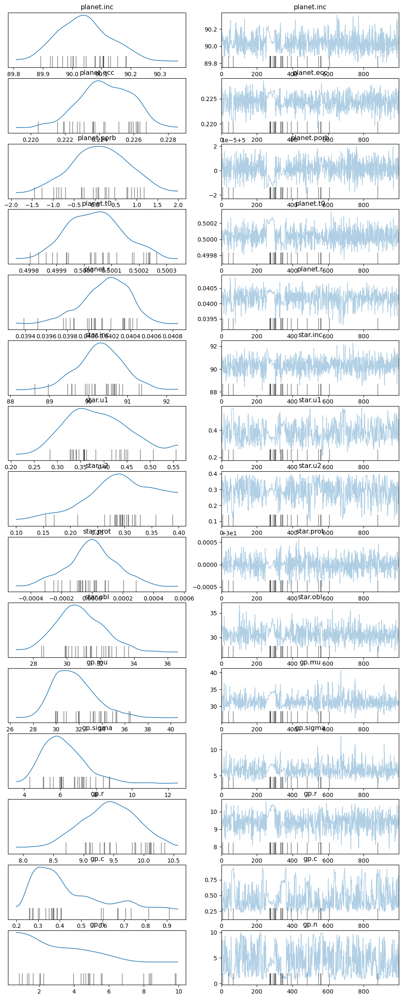

In [ ]:
with model:
    az.plot_trace(trace, var_names=free)

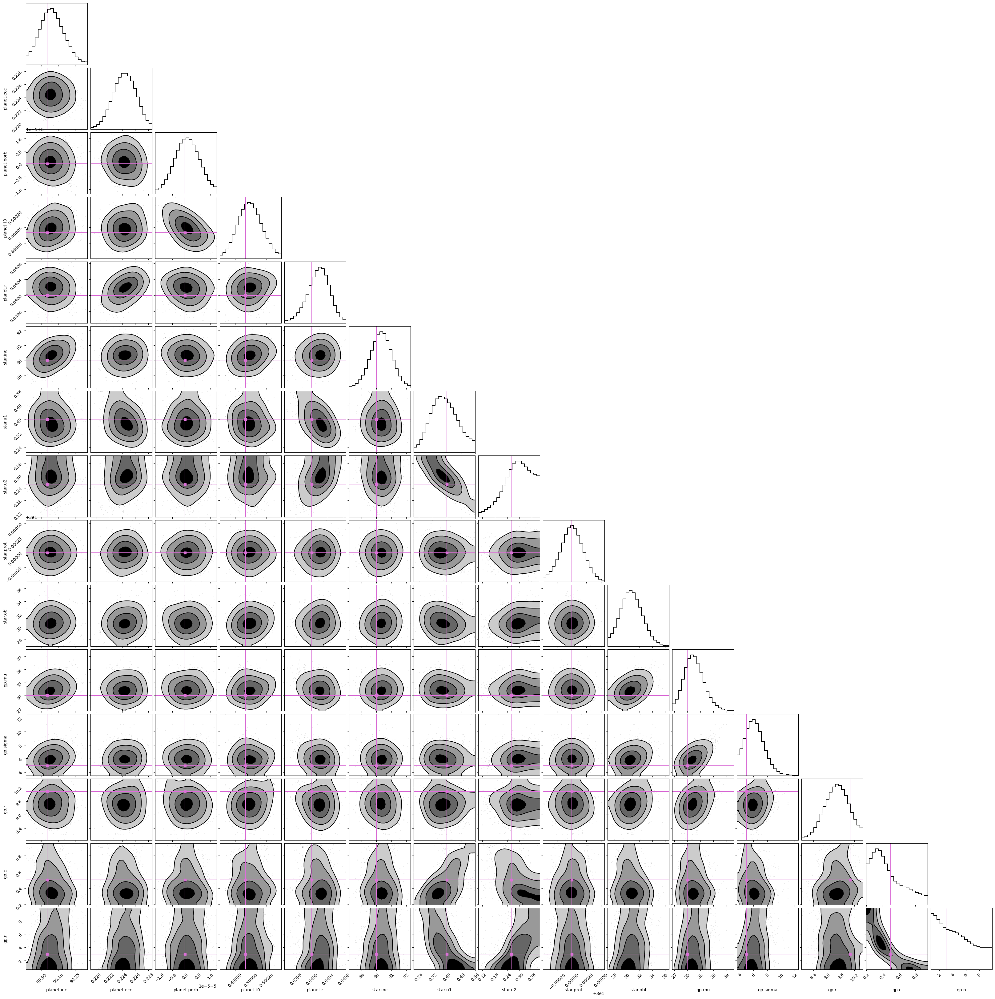

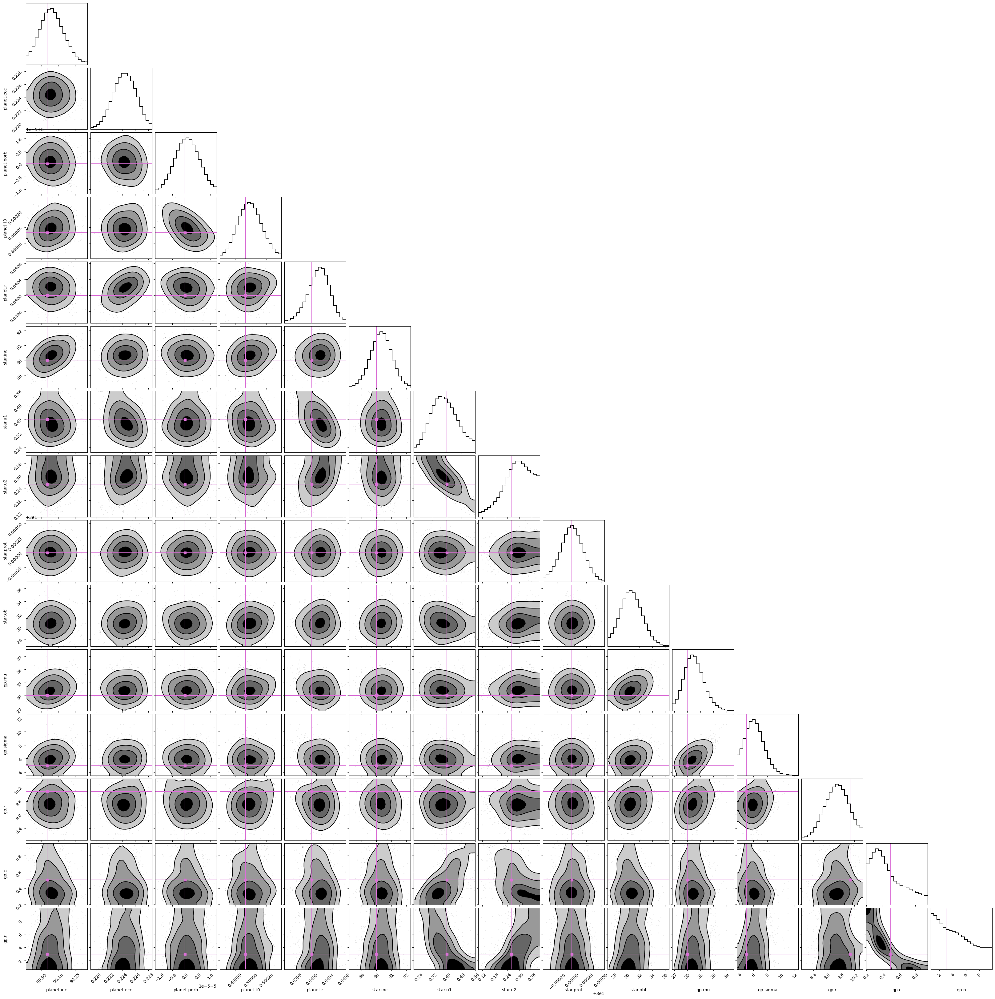

In [29]:
samples = pm.trace_to_dataframe(trace,varnames=free)
corner(np.array(samples), labels=free,
        truths=[params[x]['truth'] for x in free], 
        color='k', 
        truth_color='orchid',
        plot_datapoints=True,
        plot_density=False,
        fill_contours=True,
        smooth=2.,
        smooth1d=2.,
        hist_kwargs=dict(alpha=1))

In [30]:
az.to_netcdf(trace,'SSP-experiment-1-all-2.nc')

Got error No model on context stack. trying to find log_likelihood in translation.


'SSP-experiment-1-all-2.nc'

In [31]:
samples_fromfile = az.from_netcdf('SSP-experiment-1-all-2.nc')

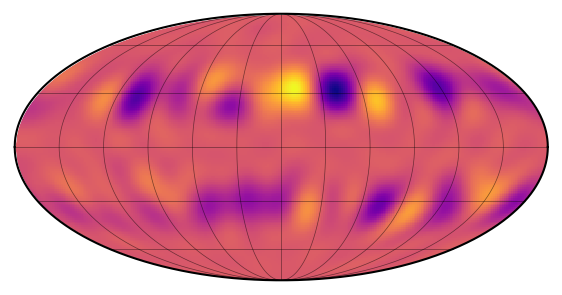

In [32]:
sp.visualize(np.mean(samples_fromfile.posterior[f'max_map'][0].values, axis=0))

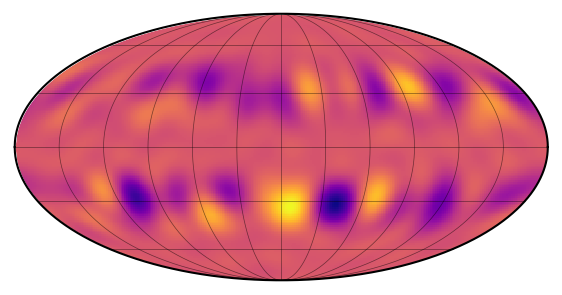

In [33]:
sp.visualize(y_true)

array([[<Axes: ylabel='gp.mu'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='gp.sigma'>, <Axes: >, <Axes: >, <Axes: >,
        <Axes: >],
       [<Axes: ylabel='gp.r'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: ylabel='gp.c'>, <Axes: >, <Axes: >, <Axes: >, <Axes: >],
       [<Axes: xlabel='gp.mu', ylabel='gp.n'>, <Axes: xlabel='gp.sigma'>,
        <Axes: xlabel='gp.r'>, <Axes: xlabel='gp.c'>,
        <Axes: xlabel='gp.n'>]], dtype=object)

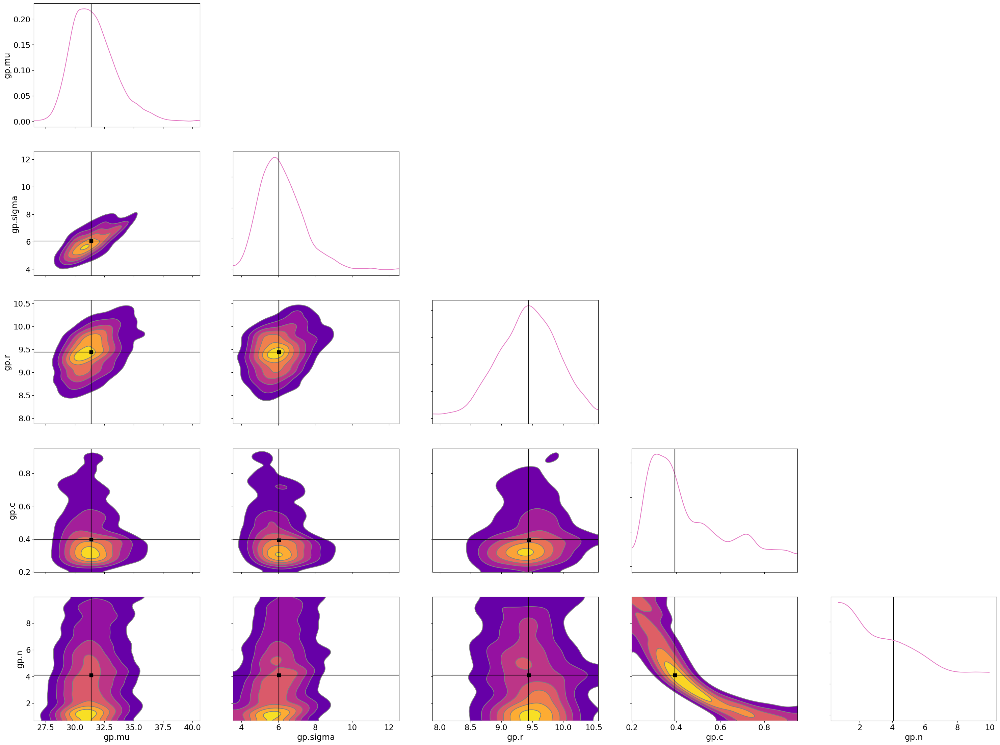

In [34]:
az.plot_pair(
    samples_fromfile.posterior, 
    var_names=['gp.mu', 'gp.sigma', 'gp.r', 'gp.c', 'gp.n'], 
    kind='kde', 
    marginals=True, 
    textsize=16.5, 
    kde_kwargs={'contourf_kwargs':{'color':'C6','cmap':plt.cm.plasma}, 'fill_kwargs':{'alpha': 0.5}},
    divergences=True,
    marginal_kwargs={'color': "C6"},
    point_estimate='median'
    )

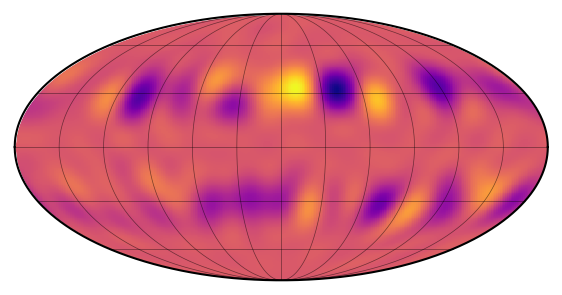

In [35]:
map_inf = starry.Map(15,2)
map_inf[:,:] = np.mean(samples_fromfile.posterior[f'max_map'][0].values, axis=0)
map_inf.show(projection='moll')

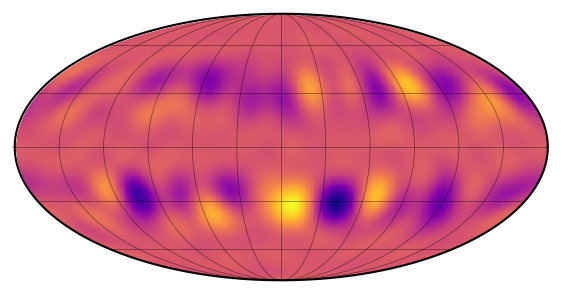

In [36]:
map_true = starry.Map(15,2)

map_true[:,:] = y_true
map_true.show(projection='moll')

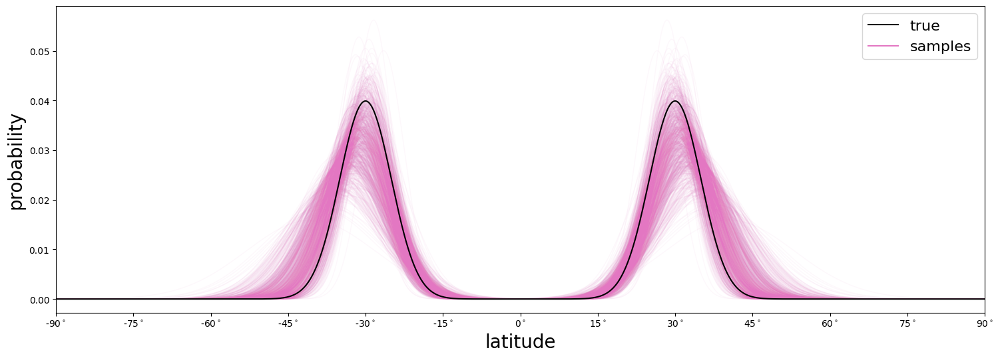

In [ ]:
from scipy.stats import norm as Normal

lat=np.linspace(-90., 90., 1000)
nsamples=1000
fig, ax = plt.subplots(1)
fig.set_size_inches(18, 6)
pdf = 0.5 * (
        Normal.pdf(lat, params['gp.mu']['truth'], params['gp.sigma']['truth'])
        + Normal.pdf(lat, -params['gp.mu']['truth'],  params['gp.sigma']['truth'])
    )
for k in range(nsamples):
    ax.plot(lat, 0.5*(Normal.pdf(lat, samples_fromfile.posterior['gp.mu'][0][k], samples_fromfile.posterior['gp.sigma'][0][k])+Normal.pdf(lat, -samples_fromfile.posterior['gp.mu'][0][k], samples_fromfile.posterior['gp.sigma'][0][k])),'C6',lw=1, alpha=0.05, zorder=-1)
ax.plot(lat, pdf,'k',label='true')
ax.plot(lat, np.nan * lat, "C6-", label="samples")
ax.legend(loc="upper right", fontsize=16)
ax.set_xlim(-90, 90)
xticks = [-90, -75, -60, -45, -30, -15, 0, 15, 30, 45, 60, 75, 90]
ax.set_xticks(xticks)
ax.set_xticklabels(["{:d}$^\circ$".format(xt) for xt in xticks])
ax.set_xlabel("latitude", fontsize=20)
ax.set_ylabel("probability", fontsize=20)

plt.savefig("figures/experiment-1-active-lats.pdf", bbox_inches="tight", dpi=300)

In [ ]:
data_dict = {var: samples_fromfile.posterior[var].values.flatten() for var in free}
samples_df = pd.DataFrame(data_dict, columns=free)

In [ ]:
samples_df['star.inc'] = 180-samples_df['star.inc'] # cheating here cause we know about the inclination-obliquity degeneracy

In [ ]:
samples_df['star.obl'] = -samples_df['star.obl'] # cheating here cause we know about the inclination-obliquity degeneracy

In [46]:
custom_labels = {
    'planet.inc': r'$i_p$',
    'planet.ecc': r'$e$',
    'planet.porb': r'$P$',
    'planet.t0': r'$t_0$',
    'planet.r': r'$R_p/R_\star$',
    'star.inc': r'$i_\star$',
    'star.u1': r'$u_1$',
    'star.u2': r'$u_2$',
    'star.prot': r'$P_\star$',
    'star.obl': r'$\lambda_\star$',
    'gp.mu': r'$\mu_\phi$',
    'gp.sigma': r'$\sigma^2_\phi$',
    'gp.r': r'$\mathbb{r}$',
    'gp.c': r'$\mathbb{c}$',
    'gp.n': r'$\mathbb{n}$'
}

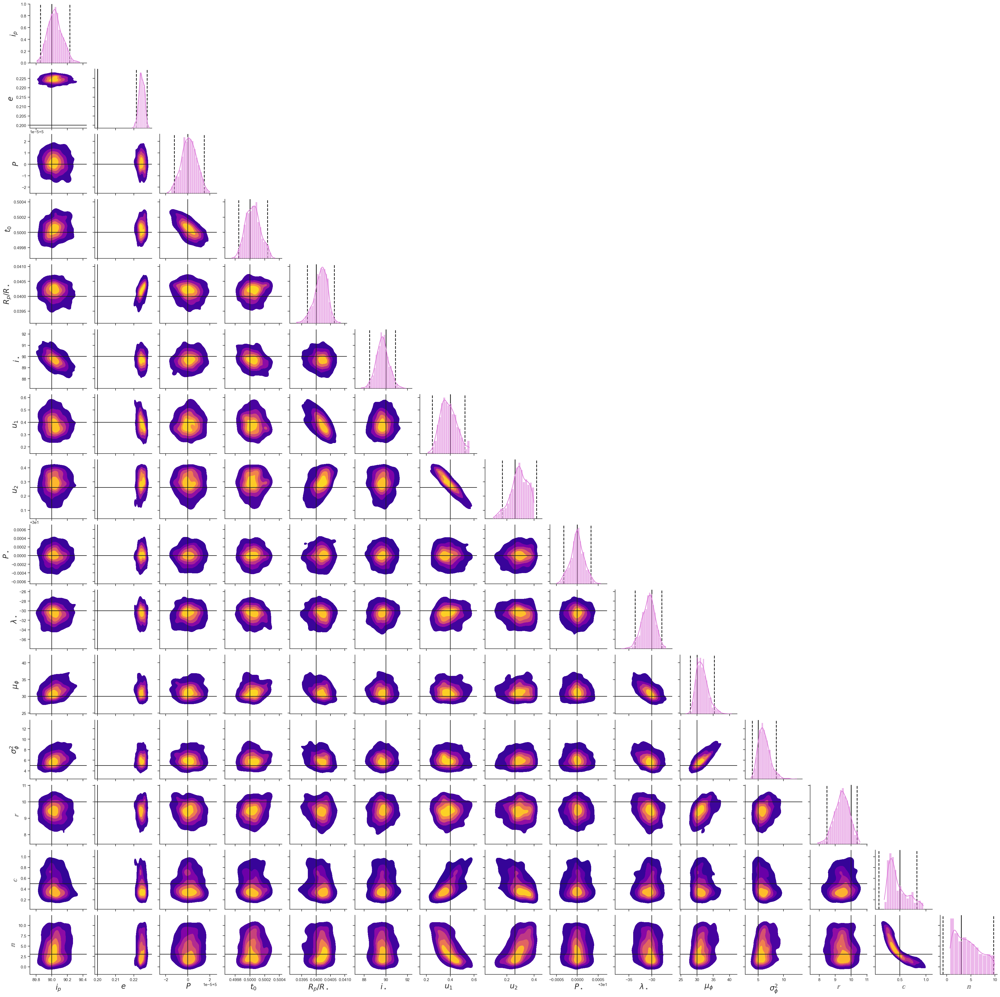

In [47]:
import pandas as pd
import seaborn as sns
sns.set(style='ticks')

# Create the pair grid
g = sns.PairGrid(samples_df, diag_sharey=False)

# Map the histograms to the diagonal
g.map_diag(sns.histplot, kde=True, color='orchid')

# Map the 2D contour plots to the lower triangle
g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

# Custom function to remove upper triangle
def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

# Remove the scatter plots and empty axes in the upper triangle
g.map_upper(remove_upper)

for i, var in enumerate(free):
    truth = params[var]['truth']
    # if var == 'star.inc':
    #     truth = 180 - params[var]['truth']
    # if var == 'star.obl':
    #     truth = - params[var]['truth']
    g.axes[i, i].axvline(truth, color='k', linestyle='-', lw=2)
    # g.axes[i, i].axhline(truth, color='k', linestyle='-')

    std = np.std(samples_df[var])
    mean = np.mean(samples_df[var])
    sigma_plus = mean + 2 * std
    sigma_minus = mean - 2 * std
    g.axes[i, i].axvline(sigma_plus, color='k', linestyle='--', lw=2)
    g.axes[i, i].axvline(sigma_minus, color='k', linestyle='--', lw=2)

# Add truth values as lines to the contour plots
for i, y_var in enumerate(free):
    for j, x_var in enumerate(free):
        if j < i:
            truth_x = params[x_var]['truth']
            truth_y = params[y_var]['truth']

            # if y_var == 'star.inc':
            #     truth_y = 180 - params[y_var]['truth']
            # if y_var == 'star.obl':
            #     truth_y = - params[y_var]['truth']

            # if x_var == 'star.inc':
            #     truth_x = 180 - params[x_var]['truth']
            # if x_var == 'star.obl':
            #     truth_x = - params[x_var]['truth']
            
            g.axes[i, j].axvline(truth_x, color='k', linestyle='-')
            g.axes[i, j].axhline(truth_y, color='k', linestyle='-')

for i, var in enumerate(free):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("figures/experiment-1-corner-all.pdf", bbox_inches="tight", dpi=300)

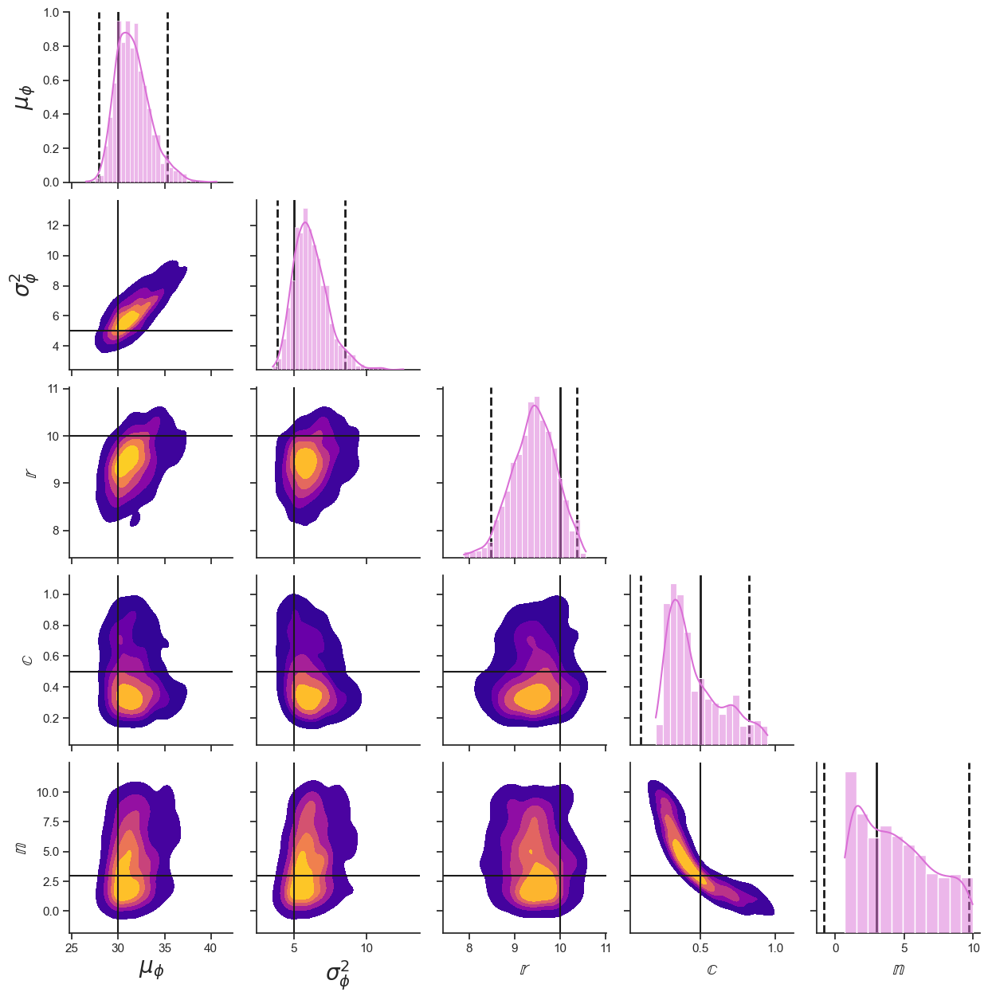

In [70]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.set(style='ticks')

# Filter the dataframe to include only the desired columns
desired_columns = ['gp.mu', 'gp.sigma', 'gp.r', 'gp.c', 'gp.n']
filtered_df = samples_df[desired_columns]

# Create the pair grid
g = sns.PairGrid(filtered_df, diag_sharey=False)

# Map the histograms to the diagonal
g.map_diag(sns.histplot, kde=True, color='orchid')

# Map the 2D contour plots to the lower triangle
g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

# Custom function to remove upper triangle
def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

# Remove the scatter plots and empty axes in the upper triangle
g.map_upper(remove_upper)

for i, var in enumerate(desired_columns):
    truth = params[var]['truth']
    g.axes[i, i].axvline(truth, color='k', linestyle='-', lw=2)

    std = np.std(filtered_df[var])
    mean = np.mean(filtered_df[var])
    sigma_plus = mean + 2 * std
    sigma_minus = mean - 2 * std
    g.axes[i, i].axvline(sigma_plus, color='k', linestyle='--', lw=2)
    g.axes[i, i].axvline(sigma_minus, color='k', linestyle='--', lw=2)

# Add truth values as lines to the contour plots
for i, y_var in enumerate(desired_columns):
    for j, x_var in enumerate(desired_columns):
        if j < i:
            truth_x = params[x_var]['truth']
            truth_y = params[y_var]['truth']
            
            g.axes[i, j].axvline(truth_x, color='k', linestyle='-')
            g.axes[i, j].axhline(truth_y, color='k', linestyle='-')

for i, var in enumerate(desired_columns):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

plt.savefig("figures/experiment-1-corner-gp-params.pdf", bbox_inches="tight", dpi=300)

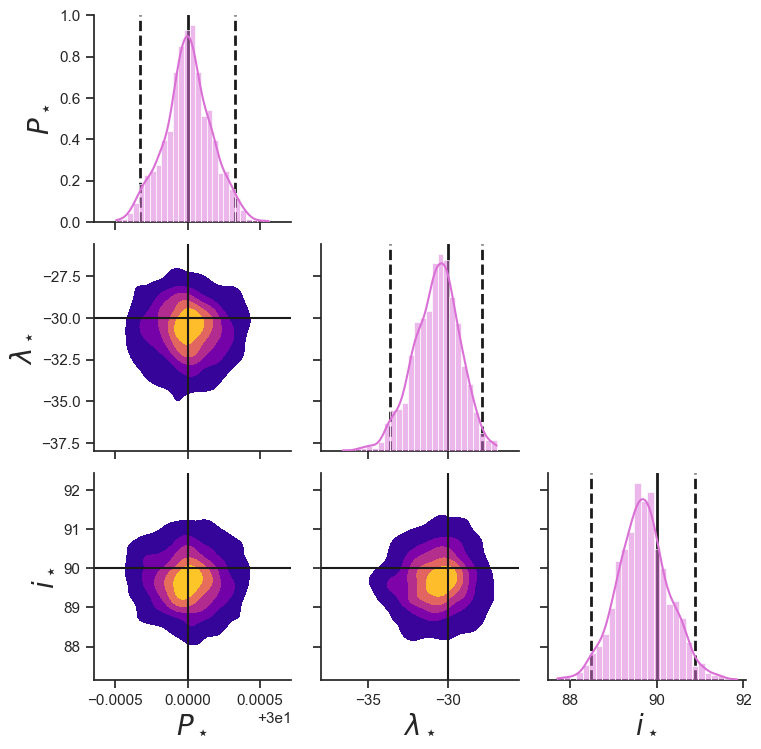

In [ ]:
# Filter the dataframe to include only the desired columns
desired_columns = ['star.prot', 'star.obl', 'star.inc']
filtered_df = samples_df[desired_columns]

# Create the pair grid
g = sns.PairGrid(filtered_df, diag_sharey=False)

# Map the histograms to the diagonal
g.map_diag(sns.histplot, kde=True, color='orchid')

# Map the 2D contour plots to the lower triangle
g.map_lower(sns.kdeplot, cmap='plasma', levels=6, fill=True)

# Custom function to remove upper triangle
def remove_upper(*args, **kwargs):
    plt.gca().axis('off')

# Remove the scatter plots and empty axes in the upper triangle
g.map_upper(remove_upper)

for i, var in enumerate(desired_columns):
    truth = params[var]['truth']
    g.axes[i, i].axvline(truth, color='k', linestyle='-', lw=2)

    std = np.std(filtered_df[var])
    mean = np.mean(filtered_df[var])
    sigma_plus = mean + 2 * std
    sigma_minus = mean - 2 * std
    g.axes[i, i].axvline(sigma_plus, color='k', linestyle='--', lw=2)
    g.axes[i, i].axvline(sigma_minus, color='k', linestyle='--', lw=2)

# Add truth values as lines to the contour plots
for i, y_var in enumerate(desired_columns):
    for j, x_var in enumerate(desired_columns):
        if j < i:
            truth_x = params[x_var]['truth']
            truth_y = params[y_var]['truth']
            
            g.axes[i, j].axvline(truth_x, color='k', linestyle='-')
            g.axes[i, j].axhline(truth_y, color='k', linestyle='-')

for i, var in enumerate(desired_columns):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)


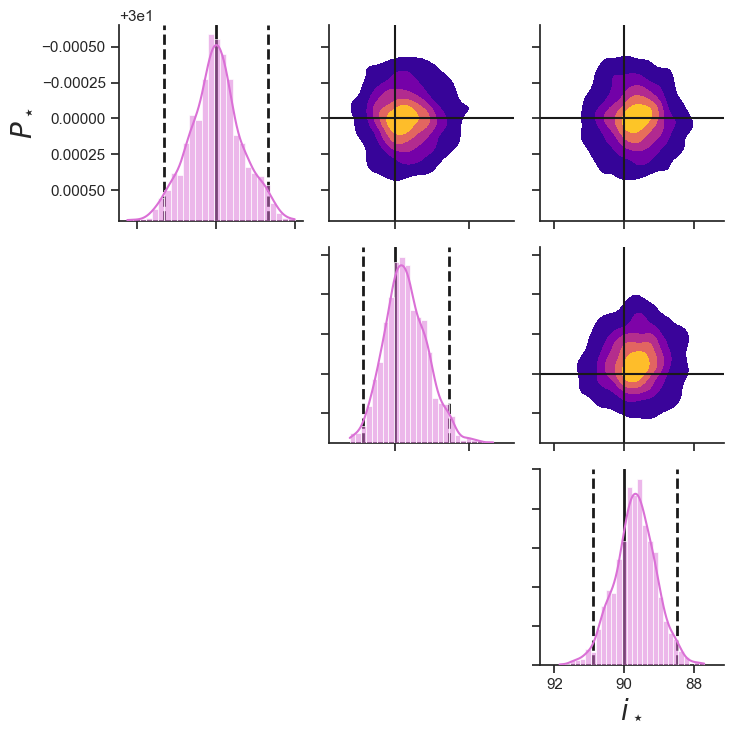

In [71]:
# Filter the dataframe for the desired columns
columns = ['star.prot', 'star.obl', 'star.inc']
df = samples_df[columns]

# Create the pair grid
g = sns.PairGrid(df, diag_sharey=False)

# Map the histograms to the diagonal
g.map_diag(sns.histplot, kde=True, color='orchid')

# Map the 2D contour plots to the upper triangle
g.map_upper(sns.kdeplot, cmap='plasma', levels=6, fill=True)

# Custom function to remove lower triangle
def remove_lower(*args, **kwargs):
    plt.gca().axis('off')

# Remove the scatter plots and empty axes in the lower triangle
g.map_lower(remove_lower)

# Add truth lines and labels
for i, var in enumerate(columns):
    truth = params[var]['truth']
    g.axes[i, i].axvline(truth, color='k', linestyle='-', lw=2)

    std = np.std(df[var])
    mean = np.mean(df[var])
    sigma_plus = mean + 2 * std
    sigma_minus = mean - 2 * std
    g.axes[i, i].axvline(sigma_plus, color='k', linestyle='--', lw=2)
    g.axes[i, i].axvline(sigma_minus, color='k', linestyle='--', lw=2)

# Add truth values as lines to the contour plots
for i, y_var in enumerate(columns):
    for j, x_var in enumerate(columns):
        if j > i:
            truth_x = params[x_var]['truth']
            truth_y = params[y_var]['truth']
            
            g.axes[i, j].axvline(truth_x, color='k', linestyle='-')
            g.axes[i, j].axhline(truth_y, color='k', linestyle='-')

# Add labels
for i, var in enumerate(columns):
    label = custom_labels.get(var, var)
    g.axes[-1, i].set_xlabel(label, fontsize=20)
    g.axes[i, 0].set_ylabel(label, fontsize=20)

# Invert axes to display the plot upside down
for ax in g.axes.flat:
    ax.invert_yaxis()
    ax.invert_xaxis()

# Adjust the layout
plt.tight_layout()

# Save the figure
plt.savefig("figures/experiment-1-corner-star-params-inverted.pdf", bbox_inches="tight", dpi=300, transparent=True)

In [ ]:
for i, var in enumerate(free):
    truth = params[var]['truth']
    # cheating here cause we know about the inclination-obliquity degeneracy
    if var == 'star.inc':
        truth = 180 - params[var]['truth']
    if var == 'star.obl':
        truth = -params[var]['truth']

    samples = samples_df[var]

    median = np.median(samples)
    std = np.std(samples)
    mean = np.mean(samples)

    lower_bound = np.percentile(samples, 16)
    upper_bound = np.percentile(samples, 84)
    
    print(f'{var}: median = {median}, mean = {mean}, std = {std}, 68% credible interval = [{median - lower_bound}, {upper_bound - median}]')


planet.inc: median = 90.03891474806817, mean = 90.04393054012418, std = 0.0945481611018749, 68% credible interval = [0.08893400039431754, 0.1038814906066392]
planet.ecc: median = 0.22435877171879304, mean = 0.22437122364079964, std = 0.0014957084207940625, 68% credible interval = [0.0014608922089862642, 0.0016137803926798422]
planet.porb: median = 5.000001243524389, mean = 5.000001282458307, std = 6.819531141654005e-06, 68% credible interval = [6.458331122338734e-06, 7.005026804840497e-06]
planet.t0: median = 0.5000394946840907, mean = 0.5000424558160764, std = 9.83189055733716e-05, 68% credible interval = [9.804590767015231e-05, 0.00010051237215280562]
planet.r: median = 0.04018824722095028, mean = 0.04016247203302821, std = 0.00023586493495618218, 68% credible interval = [0.0002470552636683748, 0.0001988951796409802]
star.inc: median = 89.6785823152893, mean = 89.69034281519616, std = 0.5966128301458459, 68% credible interval = [0.5623248492207864, 0.6008095339251014]
star.u1: median

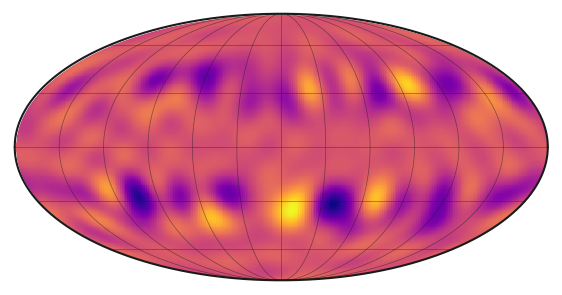

In [52]:
map_inf = starry.Map(15, 2)
map.inc = np.mean(samples_df['star.inc'][0])
map.obl = np.mean(samples_df['star.obl'][0])
map[1] = np.mean(samples_df['star.u1'][0])
map[2] = np.mean(samples_df['star.u2'][0])
star = starry.Primary(map, r=params["star.r"]["truth"], m=params["star.m"]["truth"], prot=np.mean(samples_df['star.prot'][0])) 
planet = starry.Secondary(
    starry.Map(0,0),
    inc=np.mean(samples_df['planet.inc'][0]),
    ecc=np.mean(samples_df['planet.ecc'][0]),
    Omega=params["planet.Omega"]["truth"],
    porb=np.mean(samples_df['planet.porb'][0]),
    t0=np.mean(samples_df['planet.t0'][0]),
    r=np.mean(samples_df['planet.r'][0]),
    m=params["planet.m"]["truth"],
    prot=1.0
)

sys = starry.System(star, planet)
xo, yo, zo = sys.position(t)
xo = xo.eval()[1]
yo = yo.eval()[1]
zo = zo.eval()[1]
theta = (360 * t / params["star.prot"]["truth"]) % 360
    
sp = StarryProcess(
    mu=np.mean(samples_fromfile.posterior['gp.mu'][0].values, axis=0),
    sigma=np.mean(samples_fromfile.posterior['gp.sigma'][0].values, axis=0),
    r=np.mean(samples_df['gp.r'][0]),
    c=np.mean(samples_df['gp.c'][0]),
    n=np.mean(samples_df['gp.n'][0]),
)

nt = len(t)
ssp = StarryStarryProcess(sys, sp)

y_inf = sp.sample_ylm().eval().reshape(-1)
y_inf[0] += 1
map_inf[:,:] = y_inf

map_inf.show(projection='moll')

In [ ]:
map_inf = starry.Map(15, 2)
map.inc = np.mean(samples_df['star.inc'][0])
map.obl = np.mean(samples_df['star.obl'][0])
map[1] = np.mean(samples_df['star.u1'][0])
map[2] = np.mean(samples_df['star.u2'][0])
star = starry.Primary(map, r=params["star.r"]["truth"], m=params["star.m"]["truth"], prot=np.mean(samples_df['star.prot'][0])) 
planet = starry.Secondary(
    starry.Map(0,0),
    inc=np.mean(samples_df['planet.inc'][0]),
    ecc=np.mean(samples_df['planet.ecc'][0]),
    Omega=params["planet.Omega"]["truth"],
    porb=np.mean(samples_df['planet.porb'][0]),
    t0=np.mean(samples_df['planet.t0'][0]),
    r=np.mean(samples_df['planet.r'][0]),
    m=params["planet.m"]["truth"],
    prot=1.0
)

sys = starry.System(star, planet)
xo, yo, zo = sys.position(t)
xo = xo.eval()[1]
yo = yo.eval()[1]
zo = zo.eval()[1]
theta = (360 * t / params["star.prot"]["truth"]) % 360
    
sp = StarryProcess(
    mu=np.mean(samples_fromfile.posterior['gp.mu'][0].values, axis=0),
    sigma=np.mean(samples_fromfile.posterior['gp.sigma'][0].values, axis=0),
    r=np.mean(samples_df['gp.r'][0]),
    c=np.mean(samples_df['gp.c'][0]),
    n=np.mean(samples_df['gp.n'][0]),
)

nt = len(t)
ssp = StarryStarryProcess(sys, sp)

y_inf = sp.sample_ylm().eval().reshape(-1)
y_inf[0] += 1
map_inf[:,:] = y_inf

map_inf.show(projection='moll')

In [ ]:
map_true = 

NameError: name 'map_true' is not defined

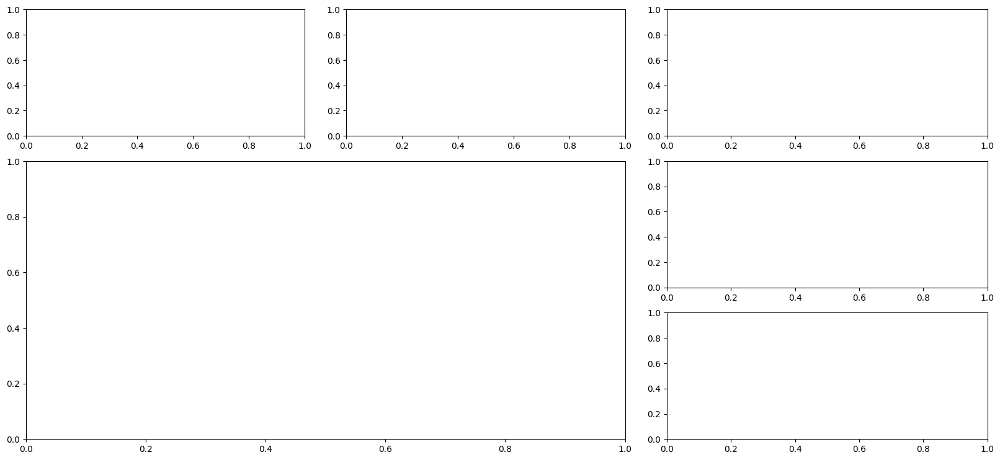

In [1]:
from matplotlib import colors
import matplotlib.pyplot as plt
import numpy as np

cmap = plt.get_cmap("plasma")
cmap.set_under("#666666")
cmap.set_over("w")
cnorm = lambda: colors.Normalize(vmin=0.0)

fig = plt.figure(figsize=(20, 9))  

# Create a 3x4 grid
gs = fig.add_gridspec(3, 4, width_ratios=[1, 1, 0.5, 0.5])

ax = [
    fig.add_subplot(gs[0, 0]),  # Top left
    fig.add_subplot(gs[0, 1]),  # Top right
    fig.add_subplot(gs[1:, :2]),  # Bottom spanning two columns
    fig.add_subplot(gs[0, 2:]),  # Top right, new column
    fig.add_subplot(gs[1, 2:]),  # Middle right, new column
    fig.add_subplot(gs[2, 2:]),  # Bottom right, new column
]

# Show the true map
map_true.show(
    ax=ax[0],
    projection="moll",
    colorbar=True,
)
ax[0].set_title('true', fontsize=20)

# # Show the inferred map
map_inf.show(
    ax=ax[1],
    projection="moll",
    colorbar=True,
    origin='lower'
)

ax[1].set_title('inferred', fontsize=20)

# Show the flux model in the bottom panel
ax[2].plot(t, flux_obs, "k.", alpha=0.9, label="observed")
ax[2].plot(t_, np.mean(samples_fromfile.posterior['flux_model'][0].values, axis=0), "C6", label="model", alpha=1, lw=3)
ax[2].legend(fontsize=18, loc="lower right")
ax[2].set_xlabel("time [days]", fontsize=20)
ax[2].set_ylabel("flux [relative]", fontsize=20)

# Add three more panels to the right
for i in range(3, 6):
    idx = (t > planet.t0.eval()+(i+3)*planet.porb.eval()-0.1) &  (t<planet.t0.eval()+(i+3)*planet.porb.eval()+0.1)
    ax[i].plot(t[idx], flux_obs[idx], "k.", alpha=0.3, label="observed")
    idx = (t_ > planet.t0.eval()+(i+3)*planet.porb.eval()-0.1) &  (t_<planet.t0.eval()+(i+3)*planet.porb.eval()+0.1)
    ax[i].plot(t_[idx], np.mean(samples_fromfile.posterior['flux_model'][0].values, axis=0)[idx], "C6", label="model", alpha=1, lw=4)
    ax[i].legend(fontsize=12, loc="lower right")
    ax[i].set_xlabel("time [days]", fontsize=16)
    ax[i].set_ylabel("flux [relative]", fontsize=16)

plt.tight_layout()

# plt.savefig("figures/experiment-1-map-comparison.pdf", bbox_inches="tight", dpi=300)

<ErrorbarContainer object of 3 artists>

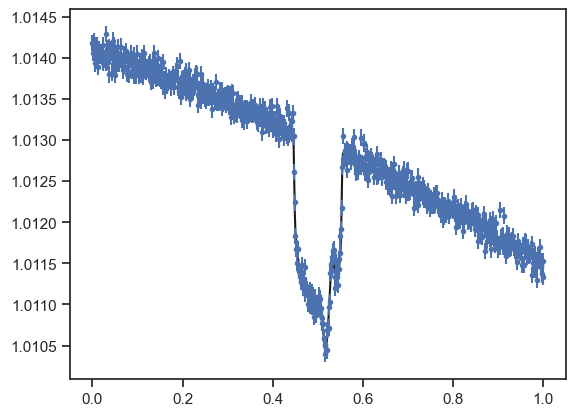

In [92]:
sel = np.abs(t) < 10/10
plt.plot(t[sel], flux_true[sel], color='k')
plt.errorbar(t[sel], flux_obs[sel], yerr=sigma_flux[sel], fmt='.')

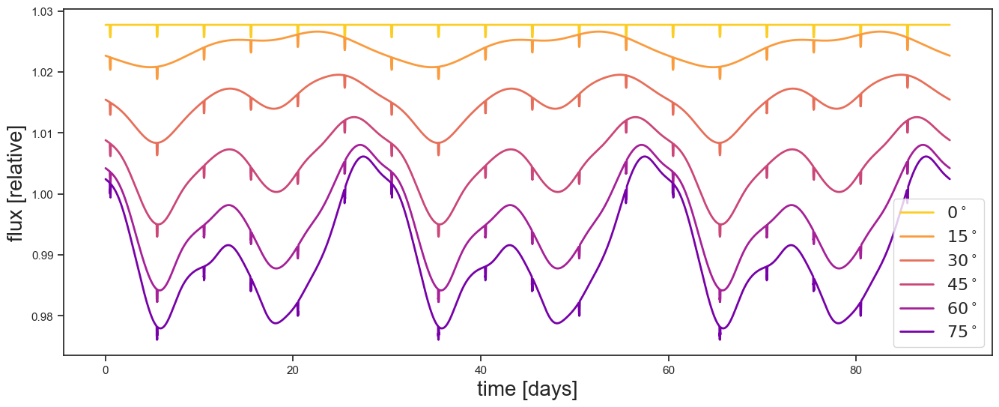

In [102]:
starry.config.lazy = True
incs = [0,15,30,45,60,75,90]

cmap = plt.get_cmap("plasma_r")
color = lambda i: cmap(0.1 + 0.8 * i / (len(incs) - 1))

plt.figure(figsize=(16,6))

for k in range(len(obls)):
    map = starry.Map(15, 2)
    map.inc = incs[k]
    map.obl = 0.0
    map[1] = params["star.u1"]["truth"]
    map[2] = params["star.u2"]["truth"]
    star = starry.Primary(map, r=params["star.r"]["truth"], m=params["star.m"]["truth"], prot=params["star.prot"]["truth"]) 
    planet = starry.Secondary(
        starry.Map(0,0),
        inc=params["planet.inc"]["truth"],
        ecc=params["planet.ecc"]["truth"],
        Omega=params["planet.Omega"]["truth"],
        porb=params["planet.porb"]["truth"],
        t0=params["planet.t0"]["truth"],
        r=params["planet.r"]["truth"],
        m=params["planet.m"]["truth"],
        prot=1.0
    )

    sys = starry.System(star, planet)
    xo, yo, zo = sys.position(t)
    xo = xo.eval()[1]
    yo = yo.eval()[1]
    zo = zo.eval()[1]
    theta = (360 * t / params["star.prot"]["truth"]) % 360
        
    sp = StarryProcess(
        a=params["gp.a"]["truth"],
        b=params["gp.b"]["truth"],
        r=params["gp.r"]["truth"],
        c=params["gp.c"]["truth"],
        n=params["gp.n"]["truth"],
    )
    y_true = sp.sample_ylm().eval()[0,:]
    y_true[0] = 1.0

    flux_true = sys.design_matrix(t).eval()[:, :-1] @ y_true
    sigma_flux = 1e-4*np.ones_like(flux_true)

    flux_obs = flux_true + sigma_flux*rng.normal(size=nt)

    # ssp = StarryStarryProcess(sys, sp, nt, len(pri.map.y.eval()))

    map[:,:] = y_true
    # map.show(ax=ax[0][k]) 

    xo, yo, zo = sys.position(t)
    xo = xo[1].eval()
    yo = yo[1].eval()
    zo = zo[1].eval()
        
    idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)

    sel = np.abs(t) < 1
    plt.plot(t, flux_true, color=color(k), lw=2, label=rf"${incs[k]}^\circ$")
    plt.legend(fontsize=16)

plt.ylabel("flux [relative]", fontsize=20)
plt.xlabel("time [days]", fontsize=20)
plt.savefig("figures/inclinations.pdf", bbox_inches="tight", dpi=300)


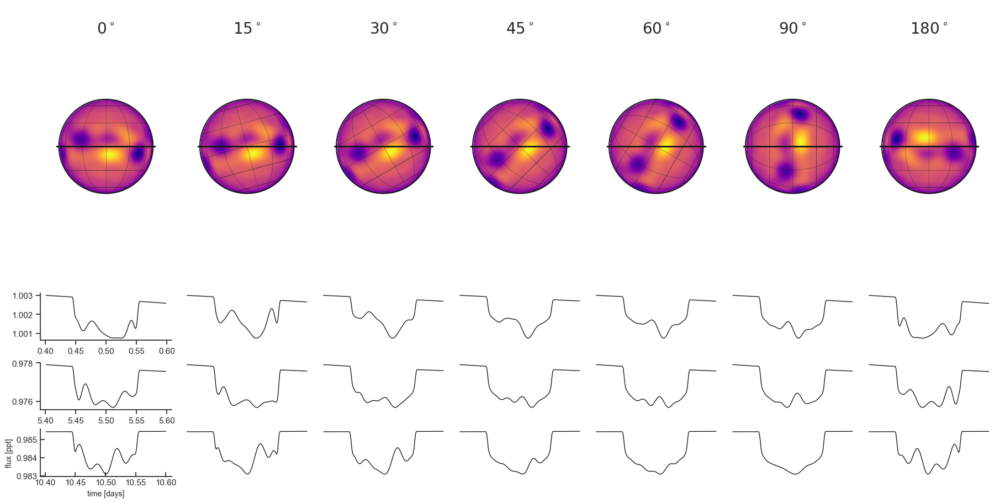

In [132]:
starry.config.lazy = True
obls = [0,15,30,45,60,90,180]

ntransits = int(np.ceil(t[-1] / params['planet.porb']['truth'])) // 6
for n in range(ntransits):
        t0 = 0 + n * params['planet.porb']['truth']
        idx |= ((t > t0 - 0.01) & (t < t0 + 0.01))

cmap = plt.get_cmap("plasma_r")
color = lambda i: cmap(0.1 + 0.8 * i / (len(6) - 1))

fig, ax = plt.subplots(
    # 2+ntransits,
    1+ntransits,
    len(obls),
    figsize=(18, 9),
    gridspec_kw={
        "height_ratios": [3]+[0.5]*ntransits,
    },
    constrained_layout=True,
)


map = starry.Map(15, udeg=2, inc = 90)
sp = StarryProcess(
        a=params["gp.a"]["truth"],
        b=params["gp.b"]["truth"],
        r=params["gp.r"]["truth"],
        c=params["gp.c"]["truth"],
        n=params["gp.n"]["truth"],
    )
y_true = sp.sample_ylm().eval()[0,:]
y_true[0] = 1.0

map[:,:] = y_true

for k in range(len(obls)):
    map.obl = obls[k]
    map[1] = params["star.u1"]["truth"]
    map[2] = params["star.u2"]["truth"]
    star = starry.Primary(map, r=params["star.r"]["truth"], m=params["star.m"]["truth"], prot=params["star.prot"]["truth"]) 
    planet = starry.Secondary(
        starry.Map(0,0),
        inc=params["planet.inc"]["truth"],
        ecc=params["planet.ecc"]["truth"],
        Omega=params["planet.Omega"]["truth"],
        porb=params["planet.porb"]["truth"],
        t0=params["planet.t0"]["truth"],
        r=params["planet.r"]["truth"],
        m=params["planet.m"]["truth"],
        prot=1.0
    )

    sys = starry.System(star, planet)

    flux_true = sys.flux(t, total=False)[0].eval()

    map.show(ax=ax[0][k])

    xo, yo, zo = sys.position(t)
    xo = xo[1].eval()
    yo = yo[1].eval()
    zo = zo[1].eval()
        
    idx = (zo > 0) | (xo ** 2 + yo ** 2 > 1)
    ax[0][k].plot(xo[idx], yo[idx], "k.", ms=1);
    ax[0][k].set_aspect(1)
    ax[0][k].set_ylim(-3, 3)

    for i in range(ntransits):

        idx = (t > planet.t0.eval()+i*planet.porb.eval()-0.1) &  (t<planet.t0.eval()+i*planet.porb.eval()+0.1)
        ax[i+1][k].plot(t[idx], flux_true[idx], color='k', lw=1)
    
        if k == 0:
                ax[i+1, k].spines["top"].set_visible(False)
                ax[i+1, k].spines["right"].set_visible(False)
        else:
            ax[i+1, k].axis("off")
        if k == 0 and i==ntransits-1:
                ax[i+1, k].set_xlabel("time [days]", fontsize=10)
                ax[i+1, k].set_ylabel("flux [ppt]", fontsize=10)
                ax[i+1, k].tick_params(direction="in")
            
    # Add annotation above each column
    ax[0, k].text(0.5, 0.9, rf"${obls[k]}^\circ$", transform=ax[0, k].transAxes,
                 fontsize=20, ha='center')
# plt.tight_layout()
# plt.subplots_adjust(top=0.5)
plt.savefig("figures/obliquities.pdf", bbox_inches="tight", dpi=300)